# ML Lab3: Machine Learning Prediction Analysis

**Santiago Álvarez Sepúlveda**

**E-mail:** saalvarezse@unal.edu.co

---

Based on the post [Machine Learning on Quantopian - Thomas Wiecki ](https://www.quantopian.com/posts/machine-learning-on-quantopian) in Quantopian and on [Naive Bayes High Low Return Prediction Analysis - German Hernandez](https://github.com/gjhernandezp/ML/blob/master/Naive%20Bayes%20High%20Low%20Return%20Prediction%20Analysis.ipynb) Jupyter Notebook. 

This Notebook uses a **Gaussian Naive Bayes model**, **Logistic Regression model** and a **Linear Support Vector Classifier** to predict if a stock will have a return **n_fwd_days** after that will be in the  **top percentile% of returns (class 1)** of the **lower  percentile% (class -1)** using as input variables the returns of 1, 2, 3, 4, 5, 6, 7, 8, 9, 10 days before, assets growth 3 months and 39 weeks before, asset to equity, capex to cashflows, EBITDA to assets and operating cashflows to assets ratios, and finally some EBTIDA yield, return on invest capital, MACD signal line for 10 days and the net income margin of the US Tradable Stocks.

In [55]:
n_fwd_days = 5 # number of days to compute returns over
percentile = 25 # target percetile of the prediction

We use dayly returns of the good quality Quantopian tradable stocks [QTradableStocksUS()](https://www.quantopian.com/posts/working-on-our-best-universe-yet-qtradablestocksus) in a period of between the **start** and **end** dates.

In [56]:
from quantopian.pipeline.filters import QTradableStocksUS
universe = QTradableStocksUS()

import pandas as pd
start = pd.Timestamp("2018-05-26")
end = pd.Timestamp("2018-09-26")

We use the [Quantopian Pipeline API](https://www.quantopian.com/tutorials/pipeline) that allows to build preprocesing filters form multiple stokcs to calcute the decision variables that we want use in trading algorithm.

We import the **Returns** function form pipeline because our input variables are past returns and our predicted class depends on the n_fwd_days ahead return.

## Building the training and testing data set

In [57]:
from quantopian.pipeline.data import Fundamentals
from quantopian.pipeline.factors import (
    CustomFactor,
    Returns,
    MACDSignal,
)

We define the function **make_factors()** that define the fucntions that will calculate the input variables for the classfication, in Quantopian the input variables used to make decision in trading algorithsm are called **factors**

We define a function inside make_factors() for ecah one of the  1,2,3,,4,5,6,7,8,9 and 10 previous returns that we are using as input variables, in order to to this we call Returns(), one of the [Built-in Factors](https://www.quantopian.com/help#module-quantopian_pipeline_factors) in the the [Quantopian Pipeline API] Returns is only called with window_lengt parameter(number of days of caculate te return)  so is using the default inputs= [USEquityPricing.close] but returns can be used other inputs like inputs=[USEquityPricing.open]

The function **make_factors()** returns a list of names and pinter to the fucntions that will be used to buld the pipeline that calculates the input variables.

In [58]:
def make_factors():
    def Asset_Growth_1d():
        return Returns(window_length=2)
    
    def Asset_Growth_2d():
        return Returns(window_length=3)

    def Asset_Growth_3d():
        return Returns(window_length=4)
    
    def Asset_Growth_4d():
        return Returns(window_length=5)

    def Asset_Growth_5d():
        return Returns(window_length=6)

    def Asset_Growth_6d():
        return Returns(window_length=7)

    def Asset_Growth_7d():
        return Returns(window_length=8)

    def Asset_Growth_8d():
        return Returns(window_length=9)

    def Asset_Growth_9d():
        return Returns(window_length=10)

    def Asset_Growth_10d():
        return Returns(window_length=11) 

    def Asset_Growth_3m():
        return Returns(window_length=63)

    def Asset_Growth_39w():
        return Returns(window_length=215)

    def Asset_Equity_Ratio():
        asset_to_equity_ratio = (
            Fundamentals.total_assets.latest /
            Fundamentals.common_stock_equity.latest
        )
        return asset_to_equity_ratio

    def Capex_to_Cashflows():
        capex_to_cashflows = (
            Fundamentals.capital_expenditure.latest /
            Fundamentals.free_cash_flow.latest

        )
        return capex_to_cashflows

    def EBITDA_yield():
        ebitda_yield = (
            (Fundamentals.ebitda.latest * 4) /
            USEquityPricing.close.latest
        )
        return ebitda_yield

    def EBITDA_to_Assets():
        ebita_to_assets = (
            (Fundamentals.ebit.latest * 4) /
            Fundamentals.total_assets.latest
        )
        return ebita_to_assets

    def return_on_total_invest_capital():
        return Fundamentals.roic.latest

    def MACD_signal_10d():
        macd_signal_10d = MACDSignal(
            fast_period=12,
            slow_period=26,
            signal_period=10,
        )
        return macd_signal_10d

    def net_income_margin():
        return Fundamentals.net_margin.latest

    def Operating_Cashflows_to_Assets():
        operating_cashflows_to_assets = (
            (Fundamentals.operating_cash_flow.latest * 4) /
            Fundamentals.total_assets.latest
        )
        return operating_cashflows_to_assets

    all_factors = {

        'Asset Growth 1d': Asset_Growth_1d,

        'Asset Growth 2d': Asset_Growth_2d,

        'Asset Growth 3d': Asset_Growth_3d,

        'Asset Growth 4d': Asset_Growth_4d,

        'Asset Growth 5d': Asset_Growth_5d,

        'Asset Growth 6d': Asset_Growth_6d,

        'Asset Growth 7d': Asset_Growth_7d,

        'Asset Growth 8d': Asset_Growth_8d,

        'Asset Growth 9d': Asset_Growth_9d,

        'Asset Growth 10d': Asset_Growth_10d,

        'Asset Growth 3m': Asset_Growth_3m,

        '39 Week Returns': Asset_Growth_39w,

        'Asset to Equity Ratio': Asset_Equity_Ratio,

        'Capex to Cashflows': Capex_to_Cashflows,

        'EBIT to Assets': EBITDA_to_Assets,

        'EBITDA Yield': EBITDA_yield,

        'Return on Invest Capital': return_on_total_invest_capital,

        'MACD Signal Line': MACD_signal_10d,

        'Net Income Margin': net_income_margin,

        'Operating Cashflows to Assets': Operating_Cashflows_to_Assets

    }     

    return all_factors

factors = make_factors()

factors

{'39 Week Returns': <function __main__.Asset_Growth_39w>,
 'Asset Growth 10d': <function __main__.Asset_Growth_10d>,
 'Asset Growth 1d': <function __main__.Asset_Growth_1d>,
 'Asset Growth 2d': <function __main__.Asset_Growth_2d>,
 'Asset Growth 3d': <function __main__.Asset_Growth_3d>,
 'Asset Growth 3m': <function __main__.Asset_Growth_3m>,
 'Asset Growth 4d': <function __main__.Asset_Growth_4d>,
 'Asset Growth 5d': <function __main__.Asset_Growth_5d>,
 'Asset Growth 6d': <function __main__.Asset_Growth_6d>,
 'Asset Growth 7d': <function __main__.Asset_Growth_7d>,
 'Asset Growth 8d': <function __main__.Asset_Growth_8d>,
 'Asset Growth 9d': <function __main__.Asset_Growth_9d>,
 'Asset to Equity Ratio': <function __main__.Asset_Equity_Ratio>,
 'Capex to Cashflows': <function __main__.Capex_to_Cashflows>,
 'EBIT to Assets': <function __main__.EBITDA_to_Assets>,
 'EBITDA Yield': <function __main__.EBITDA_yield>,
 'MACD Signal Line': <function __main__.MACD_signal_10d>,
 'Net Income Margi

We import the **Pipeline** function from the [Quantopian Pipeline API](https://www.quantopian.com/tutorials/pipeline) that build a preprocesing filters from a dictionary of factors names and pointers.

In [59]:
from quantopian.pipeline import Pipeline

We use the Pipeline to define the **make_history_pipeline()** that will produce the filter that will be applied to obtain build datafarem with the information of the input and target variables.

In [60]:
from quantopian.pipeline.data.builtin import USEquityPricing


def make_history_pipeline(factors, universe, n_fwd_days=5):
    
    # Build dictionary of factors names and definitions used to calculate the information of the input variables 
    factor_ranks = {name: f() for name, f in factors.iteritems()}
    
    # Add to the dictionary the factor name and definitios used to calculate the information of the target variable
    factor_ranks['Returns'] = Returns(inputs=[USEquityPricing.open],window_length=n_fwd_days)
    
    print factor_ranks
    
    pipe = Pipeline(screen=universe, columns=factor_ranks)
    
    return pipe

history_pipe = make_history_pipeline(factors, universe, n_fwd_days=n_fwd_days)

history_pipe

{'Asset Growth 4d': Returns([EquityPricing.close], 5), 'Asset Growth 5d': Returns([EquityPricing.close], 6), 'Return on Invest Capital': Latest([Fundamentals<US>.roic], 1), 'Asset Growth 7d': Returns([EquityPricing.close], 8), '39 Week Returns': Returns([EquityPricing.close], 215), 'Asset Growth 6d': Returns([EquityPricing.close], 7), 'Asset to Equity Ratio': NumExprFactor(expr='x_0 / x_1', bindings={'x_0': Latest([Fundamentals<US>.total_assets], 1), 'x_1': Latest([Fundamentals<US>.common_stock_equity], 1)}), 'Capex to Cashflows': NumExprFactor(expr='x_0 / x_1', bindings={'x_0': Latest([Fundamentals<US>.capital_expenditure], 1), 'x_1': Latest([Fundamentals<US>.free_cash_flow], 1)}), 'EBITDA Yield': NumExprFactor(expr='(x_0 * (4.0)) / (x_1)', bindings={'x_0': Latest([Fundamentals<US>.ebitda], 1), 'x_1': Latest([EquityPricing<US>.close], 1)}), 'MACD Signal Line': MovingAverageConvergenceDivergenceSignal([EquityPricing.close], 35), 'Asset Growth 3d': Returns([EquityPricing.close], 4), 'Re

We import the **run_pipeline** function from the [Quantopian Pipeline API](https://www.quantopian.com/tutorials/pipeline) that receives a pipe, a star_date and end_date, and  builds data frame with the the information of the input and target variables in that period.

In [61]:
from quantopian.research import run_pipeline

We call  **run_pipeline** with the history_pipe between to between the **start** and **end** dates.

In [62]:
from time import time
start_timer = time()
results = run_pipeline(history_pipe, start_date=start, end_date=end)
results.index.names = ['date', 'security']
end_timer = time()
print "Time to run pipeline %.2f secs" % (end_timer - start_timer)

Time to run pipeline 6.55 secs


In [63]:
results.head()

39 Week Returns  \
date                      security                             
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])         -0.247277   
                          Equity(24 [AAPL])         0.273854   
                          Equity(41 [ARCB])         1.179255   
                          Equity(52 [ABM])         -0.326177   
                          Equity(53 [ABMD])         1.732991   

                                             Asset Growth 10d  \
date                      security                              
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])           0.012630   
                          Equity(24 [AAPL])         -0.000053   
                          Equity(41 [ARCB])         -0.002544   
                          Equity(52 [ABM])          -0.038961   
                          Equity(53 [ABMD])          0.057736   

                                             Asset Growth 1d  Asset Growth 2d  \
date                      security                                              
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])         -0.002704        -0.010730   
                          Equity(24 [AAPL])         0.001966         0.000690   
                          Equity(41 [ARCB])        -0.022845        -0.003178   
                          Equity(52 [ABM])          0.000000        -0.005106   
                          Equity(53 [ABMD])        -0.001141        -0.004295   

                                             Asset Growth 3d  Asset Growth 3m  \
date                      security                                              
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])         -0.005930        -0.251760   
                          Equity(24 [AAPL])         0.006780         0.061496   
                          Equity(41 [ARCB])        -0.020812         0.426015   
                          Equity(52 [ABM])         -0.020771        -0.180145   
                          Equity(53 [ABMD])         0.020061         0.453436   

                                             Asset Growth 4d  Asset Growth 5d  \
date                      security                                              
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])          0.000000         0.019348   
                          Equity(24 [AAPL])         0.005117         0.012293   
                          Equity(41 [ARCB])        -0.045639        -0.013627   
                          Equity(52 [ABM])         -0.026316        -0.016818   
                          Equity(53 [ABMD])         0.039680         0.025263   

                                             Asset Growth 6d  Asset Growth 7d  \
date                      security                                              
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])          0.015419         0.023591   
                          Equity(24 [AAPL])         0.008449         0.002072   
                          Equity(41 [ARCB])        -0.026887        -0.020812   
                          Equity(52 [ABM])         -0.029065        -0.034676   
                          Equity(53 [ABMD])         0.037600         0.031597   

                                               ...     Asset Growth 9d  \
date                      security             ...                       
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])     ...            0.005453   
                          Equity(24 [AAPL])    ...            0.002179   
                          Equity(41 [ARCB])    ...           -0.011555   
                          Equity(52 [ABM])     ...           -0.034995   
                          Equity(53 [ABMD])    ...            0.048895   

                                             Asset to Equity Ratio  \
date                      security                                   
2018-05-29 00:00:00+00:00 Equity(2 [ARNC])                3.494917   
                          Equity(24 [AAPL])               2.896499   
                          Equity(41 [ARCB])               2.040775   

In [64]:
results.tail()

39 Week Returns  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])                NaN   
                          Equity(51576 [CASA])                NaN   
                          Equity(51580 [NMRK])                NaN   
                          Equity(51615 [LILA_K])              NaN   
                          Equity(51618 [NTR])                 NaN   

                                                  Asset Growth 10d  \
date                      security                                   
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])            0.150759   
                          Equity(51576 [CASA])           -0.001304   
                          Equity(51580 [NMRK])           -0.078969   
                          Equity(51615 [LILA_K])          0.071142   
                          Equity(51618 [NTR])             0.031267   

                                                  Asset Growth 1d  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])           0.020192   
                          Equity(51576 [CASA])          -0.009056   
                          Equity(51580 [NMRK])          -0.036522   
                          Equity(51615 [LILA_K])        -0.004655   
                          Equity(51618 [NTR])            0.014572   

                                                  Asset Growth 2d  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])           0.011439   
                          Equity(51576 [CASA])          -0.054904   
                          Equity(51580 [NMRK])          -0.022065   
                          Equity(51615 [LILA_K])        -0.008349   
                          Equity(51618 [NTR])            0.008210   

                                                  Asset Growth 3d  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])           0.016284   
                          Equity(51576 [CASA])          -0.061275   
                          Equity(51580 [NMRK])           0.011872   
                          Equity(51615 [LILA_K])        -0.008349   
                          Equity(51618 [NTR])           -0.001730   

                                                  Asset Growth 3m  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])           0.273709   
                          Equity(51576 [CASA])          -0.102256   
                          Equity(51580 [NMRK])          -0.218991   
                          Equity(51615 [LILA_K])         0.063682   
                          Equity(51618 [NTR])            0.082115   

                                                  Asset Growth 4d  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])           0.038669   
                          Equity(51576 [CASA])          -0.060123   
                          Equity(51580 [NMRK])           0.023084   
                          Equity(51615 [LILA_K])        -0.005119   
                          Equity(51618 [NTR])           -0.015185   

                                                  Asset Growth 5d  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(51542 [DNLI])           0.036639   
                          Equity(51576 [CASA])          -0.037688   
                          Equity(51580 [NMRK])           0.004533   
                          Equity(51615 [LILA_K])         0.025912   
                          Equity(51618 [NTR])           -0.011813   

                                                  Asset Growth 6d  \
date                      security                                  
2018-09-26 00:00:00+00:00 Equity(

We extract, shift,mask,recode and split the information for the **X_train and X_test  (input variables)** and the **Y_train and Y_test(target)** variable, using the information in the **results** dataframe.

We split our data into **training** (80%) and testing (20%).

In [65]:
import numpy as np

training = 0.8

In [66]:
results_wo_returns = results.copy()
returns = results_wo_returns.pop('Returns')
Y = returns.unstack().values
X = results_wo_returns.to_panel() 
X = X.swapaxes(2, 0).swapaxes(0, 1).values # (factors, time, stocks) -> (time, stocks, factors)

In [67]:
n_time, n_stocks, n_factors = X.shape
train_size = np.int16(np.round(training * n_time))
X_train_aux, Y_train_aux = X[:train_size, ...], Y[:train_size]
X_test_aux, Y_test_aux = X[(train_size+n_fwd_days):, ...], Y[(train_size+n_fwd_days):]

We check how many **(days, stocks, varaibles)**  we have in the training set before fitering nans

In [68]:
n_time, n_stocks, n_factors = X_train_aux.shape
print X_train_aux.shape, n_time* n_stocks

(68, 2293, 20) 155924


We check how many **(days, stocks, varaibles)** we have in the testing set before fitering nans

In [69]:
n_time, n_stocks, n_factors = X_test_aux.shape
print X_test_aux.shape, n_time* n_stocks

(12, 2293, 20) 27516


We crate a helper function **shift_recode_mask_data ()** that 
* Shift factors (input variables - returns) to align these with the future target (return n_fwd_days days ahead).
* Recode the target Y as 1 and -1
* Eliminates examples thathave nan values or are not in the classes 1 and -1

In [70]:
def shift_recode_mask_data(X, Y, upper_percentile=100-percentile, lower_percentile=percentile, n_fwd_days=1):
    # Shift X to match factors at t to returns at t+n_fwd_days (we want to predict future returns after all)
    shifted_X = np.roll(X, n_fwd_days+1, axis=0)
    
    # Slice off rolled elements
    X = shifted_X[n_fwd_days+1:]
    Y = Y[n_fwd_days+1:]
    
    n_time, n_stocks, n_factors = X.shape
    
    # Look for biggest up and down movers
    upper = np.nanpercentile(Y, upper_percentile, axis=1)[:, np.newaxis]
    lower = np.nanpercentile(Y, lower_percentile, axis=1)[:, np.newaxis]
  
    upper_mask = (Y >= upper)
    lower_mask = (Y <= lower)
    
    mask = upper_mask | lower_mask # This also drops nans
    mask = mask.flatten()
    
    # Only try to predict whether a stock moved up/down relative to other stocks
    Y_binary = np.zeros(n_time * n_stocks)
    Y_binary[upper_mask.flatten()] = 1
    Y_binary[lower_mask.flatten()] = -1
    
    # Flatten X
    X = X.reshape((n_time * n_stocks, n_factors))

    # Drop stocks that did not move much (i.e. are not in the upper_percentile or the lower_percentile )
    X = X[mask]
    Y_binary = Y_binary[mask]
    
    # Drop stocks with nan returns
    masknan=  ~np.isnan(X).any(axis=1)
    X = X[masknan]
    Y_binary = Y_binary[masknan]
    
    return X, Y_binary

In [71]:
X_train, Y_train = shift_recode_mask_data(X_train_aux, Y_train_aux, n_fwd_days=n_fwd_days)
X_test, Y_test = shift_recode_mask_data(X_test_aux, Y_test_aux, n_fwd_days=n_fwd_days, 
                                             lower_percentile=50, 
                                             upper_percentile=50)

We check how many examples we have in the traning and  testing set after applying shift_recode_mask_data ()

In [72]:
X_train.shape, X_test.shape

((60594, 20), (11456, 20))

## Explore the data visualy

In [73]:
import matplotlib.pyplot as plt

X = X_train
Y = Y_train

color = [] 
for i in range(len(Y)):
    if Y[i] == 1:
        color.append('green')
    else:
        color.append('red')

Mapping 39 Week Returns against other variables


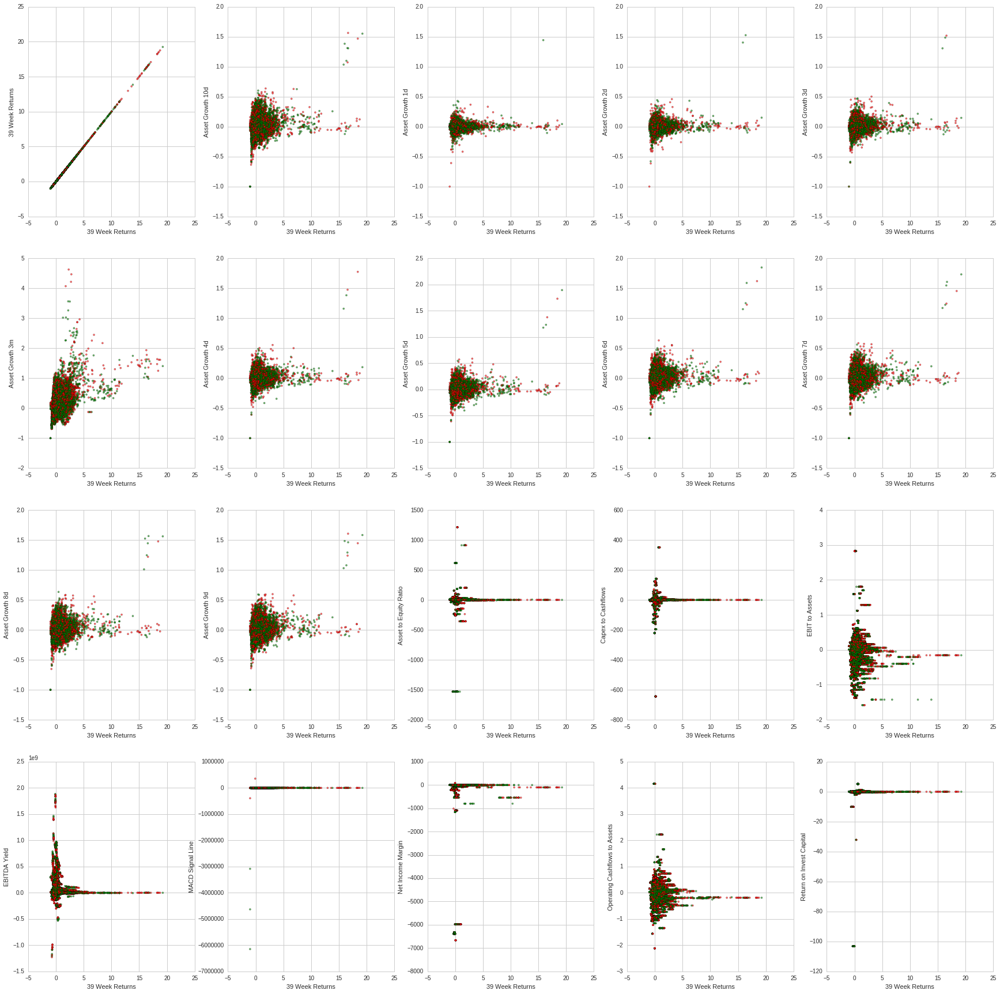

Mapping Asset Growth 10d against other variables


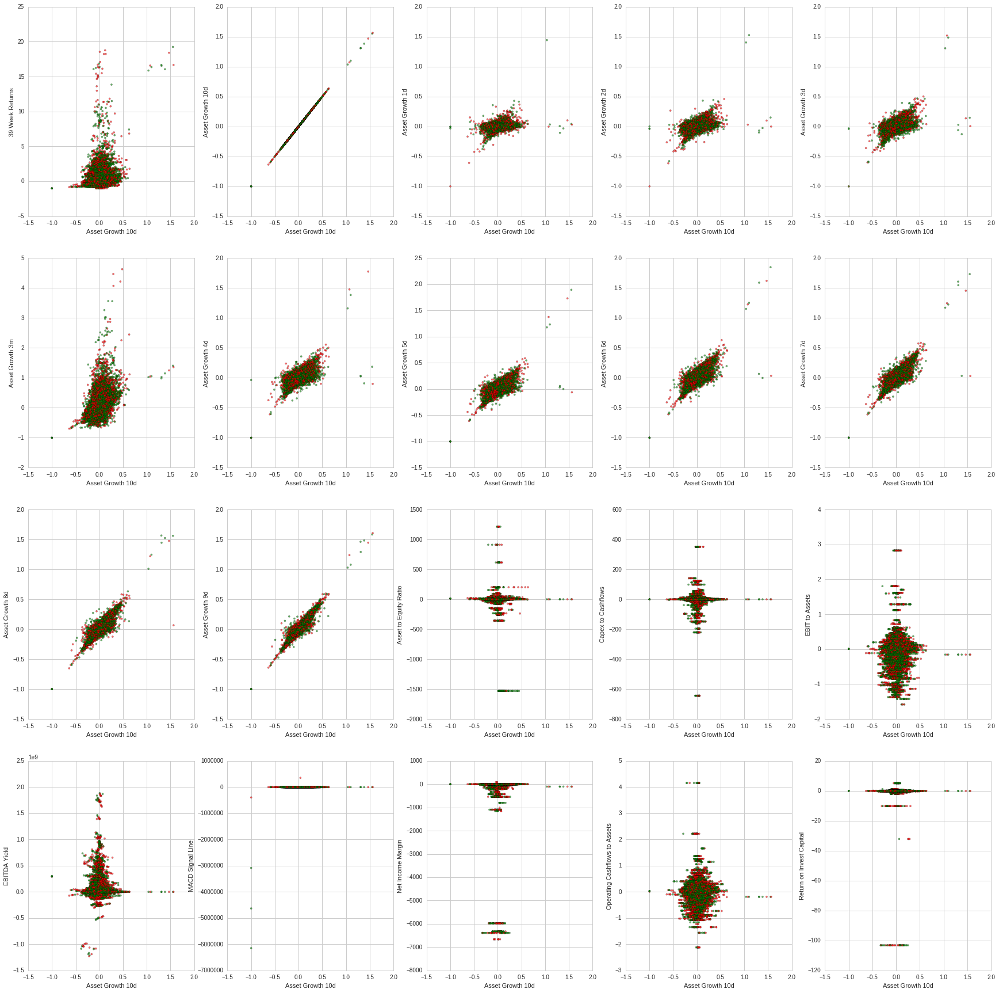

Mapping Asset Growth 1d against other variables


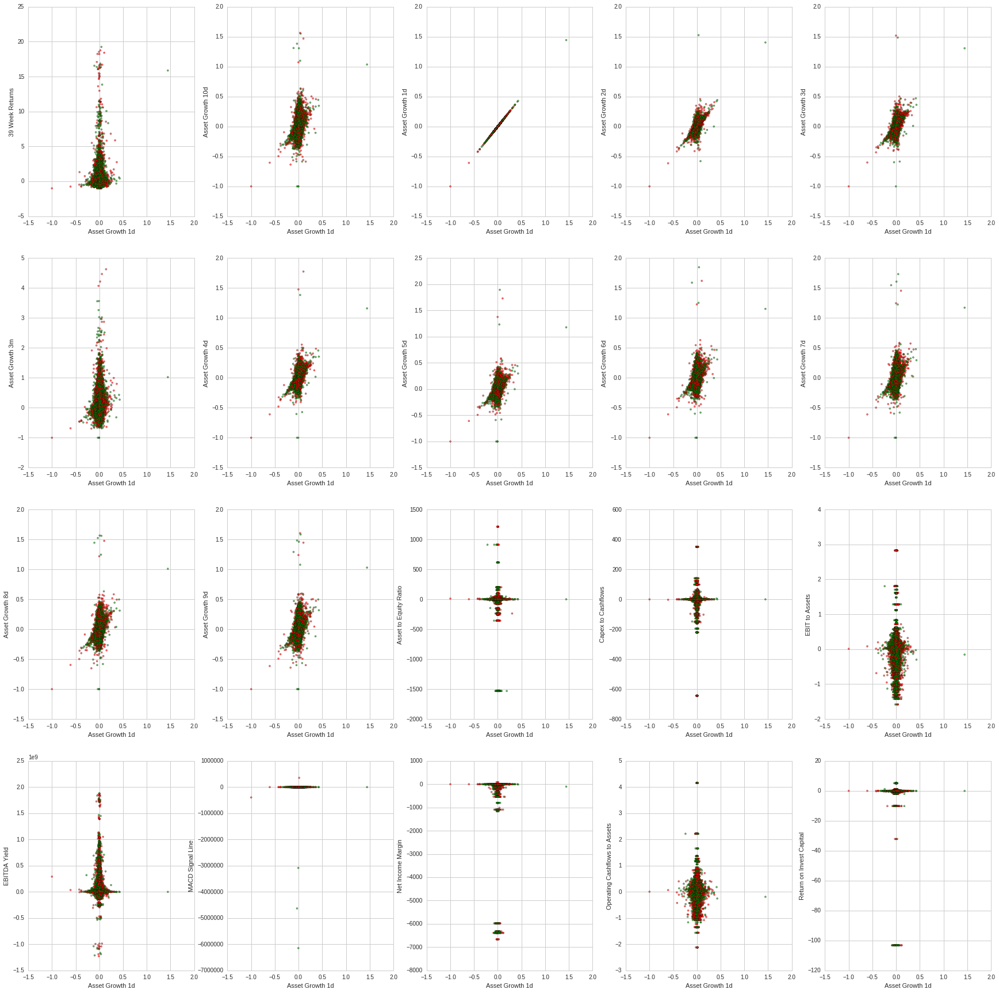

Mapping Asset Growth 2d against other variables


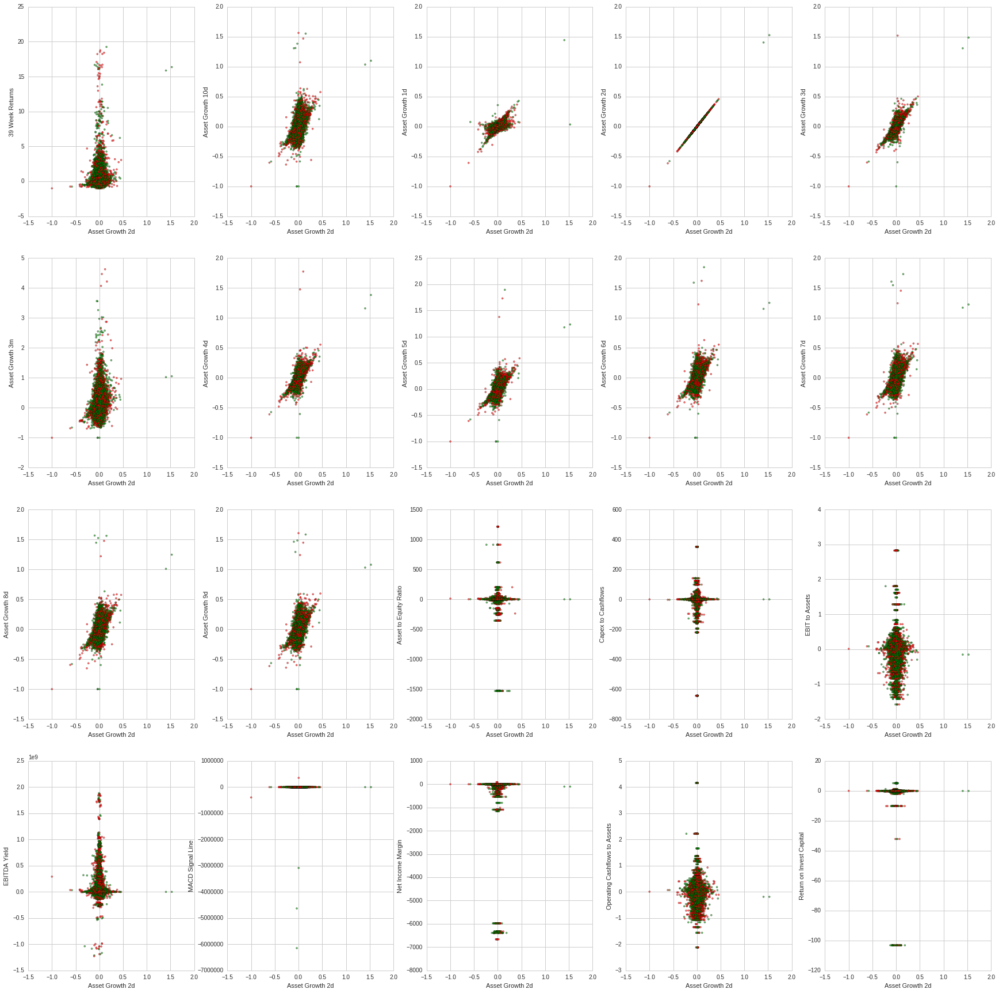

Mapping Asset Growth 3d against other variables


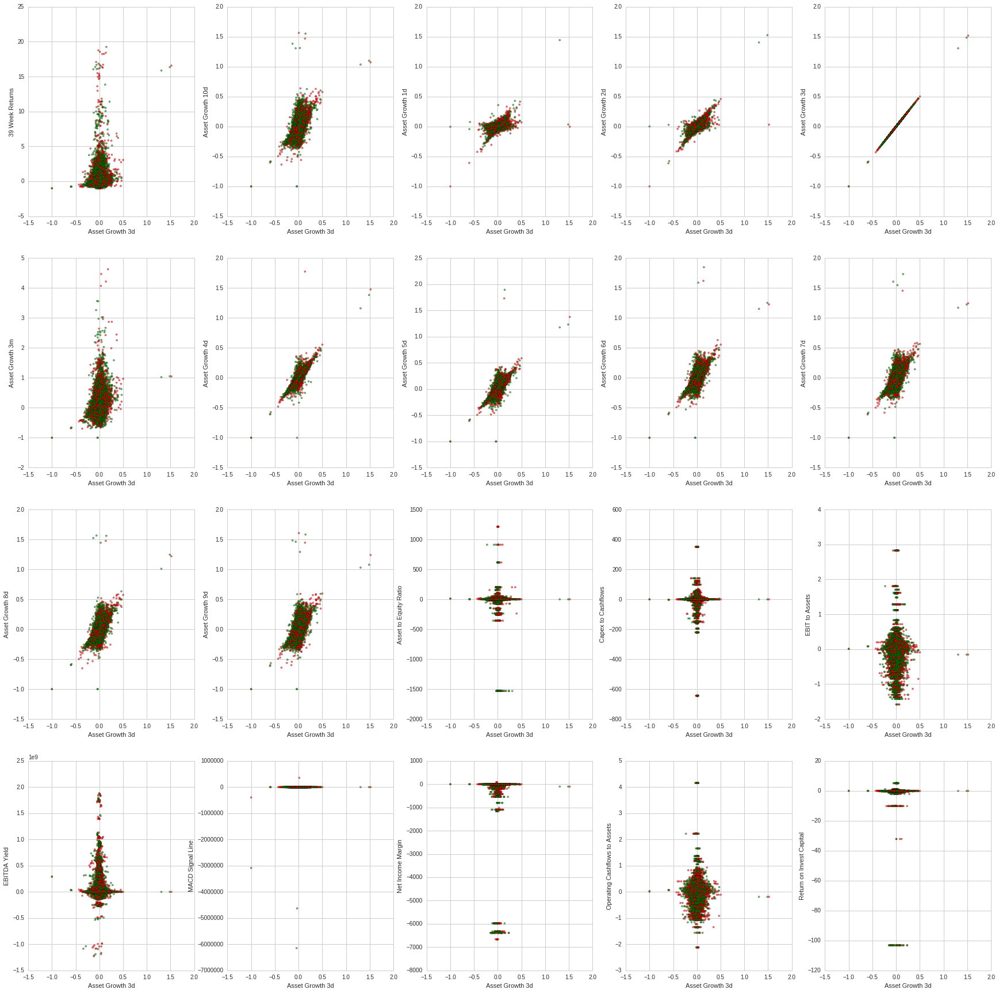

Mapping Asset Growth 3m against other variables


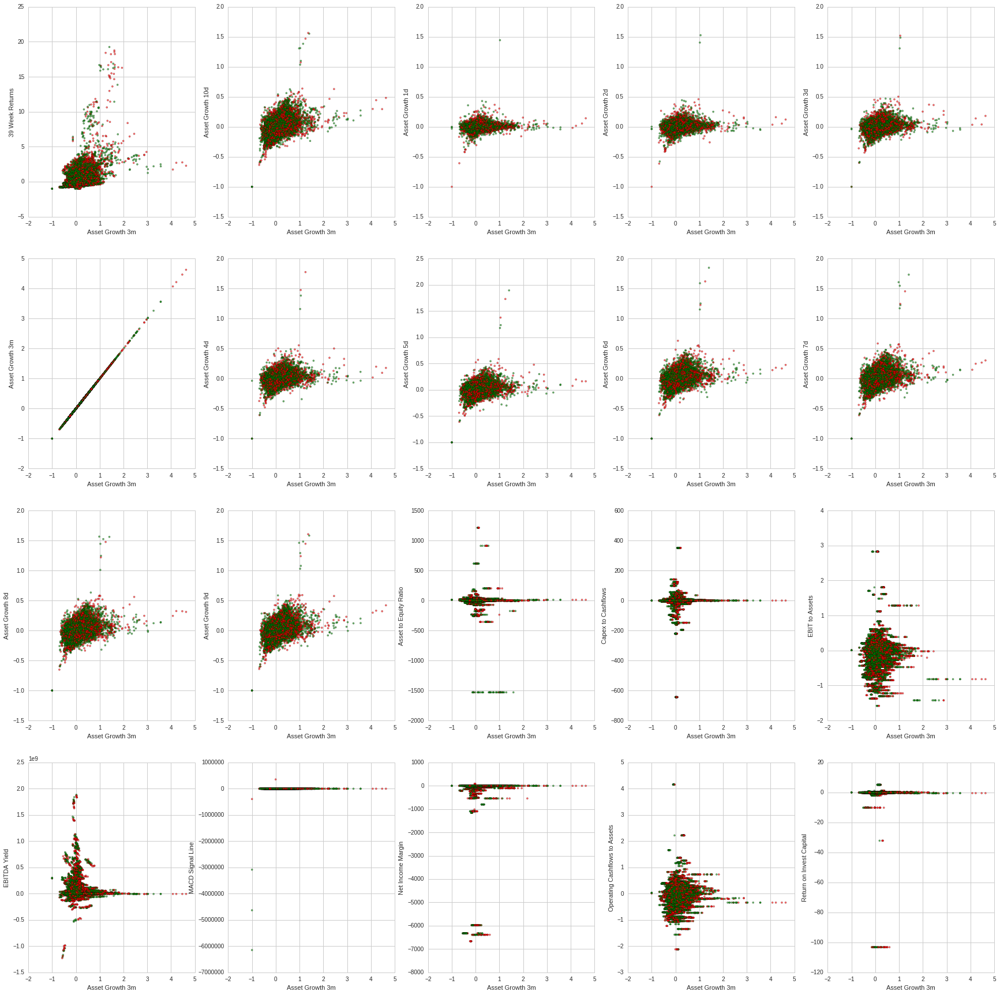

Mapping Asset Growth 4d against other variables


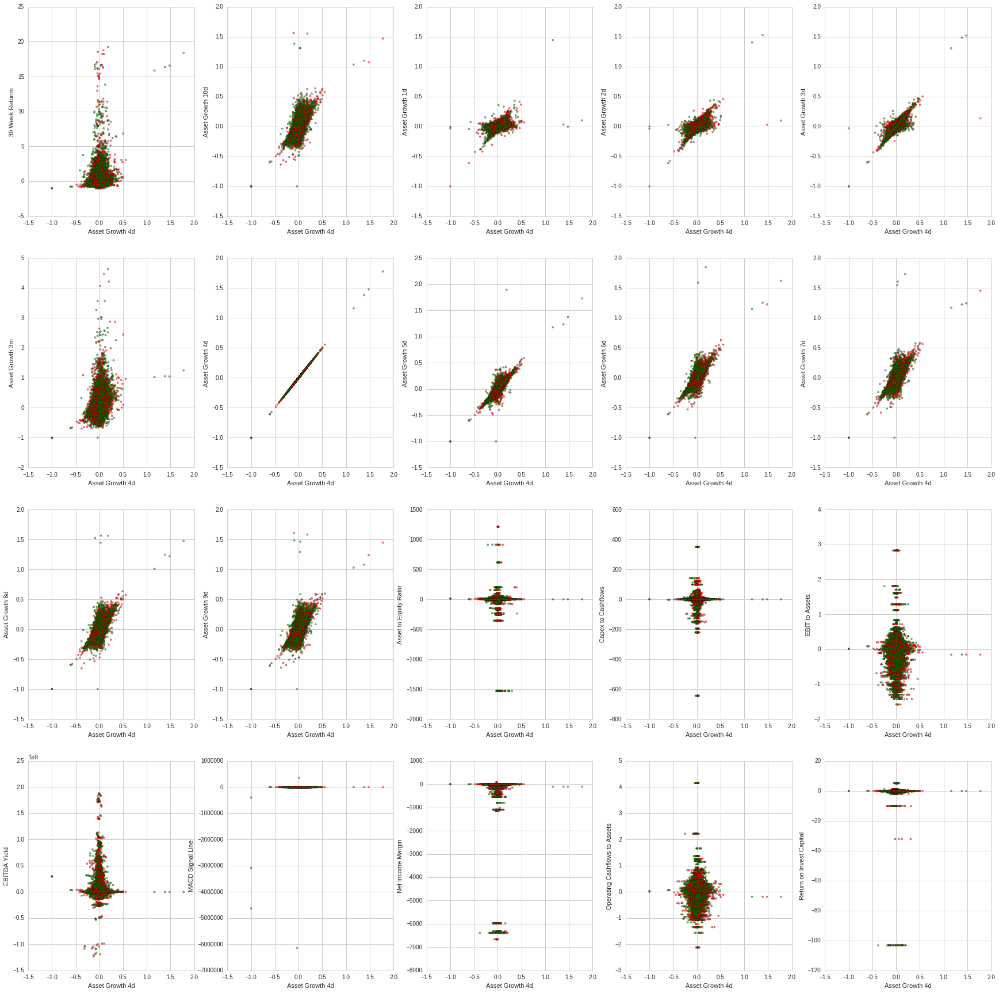

Mapping Asset Growth 5d against other variables


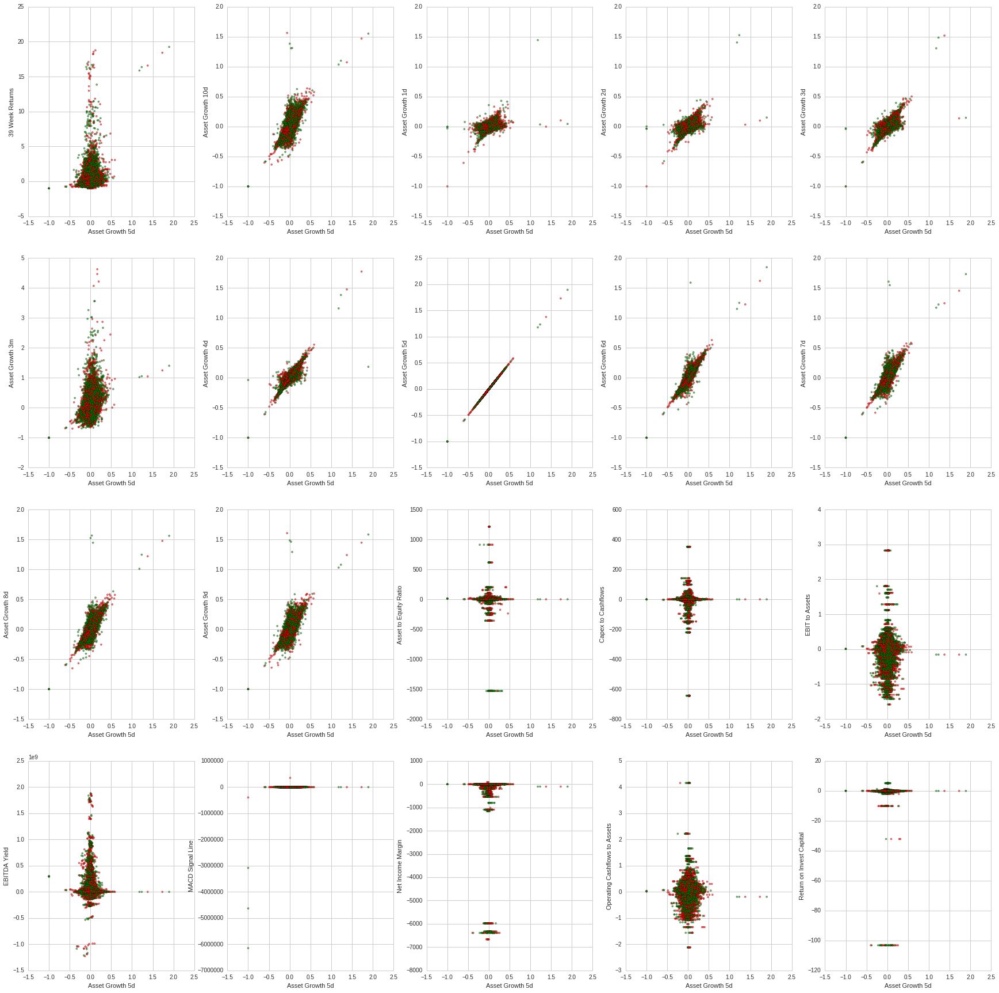

Mapping Asset Growth 6d against other variables


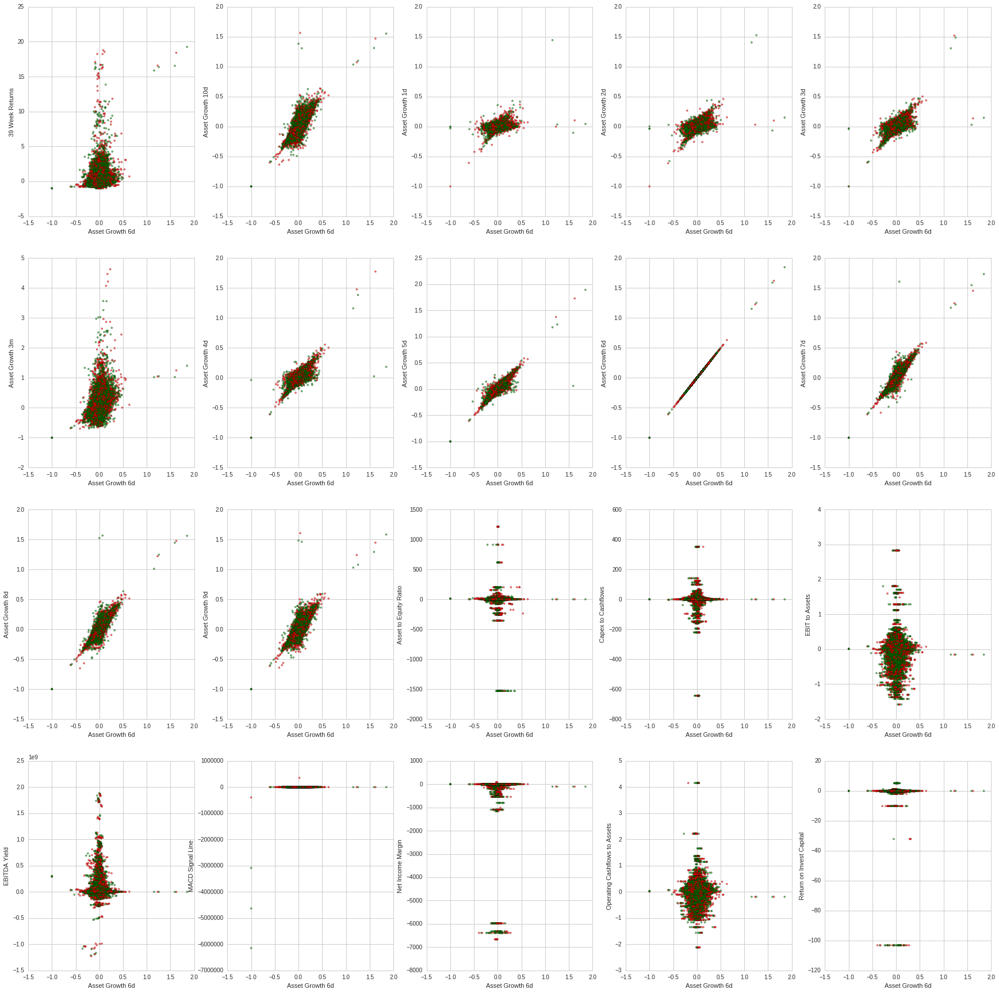

Mapping Asset Growth 7d against other variables


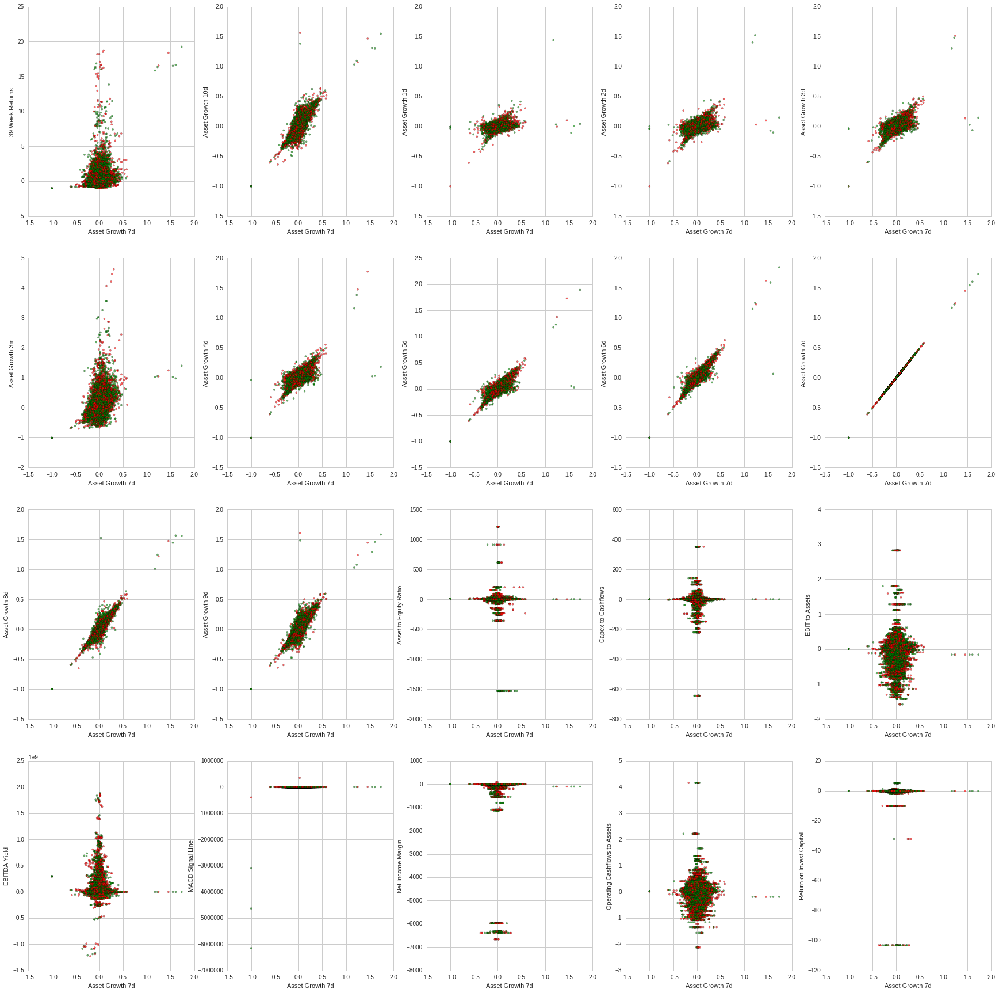

Mapping Asset Growth 8d against other variables


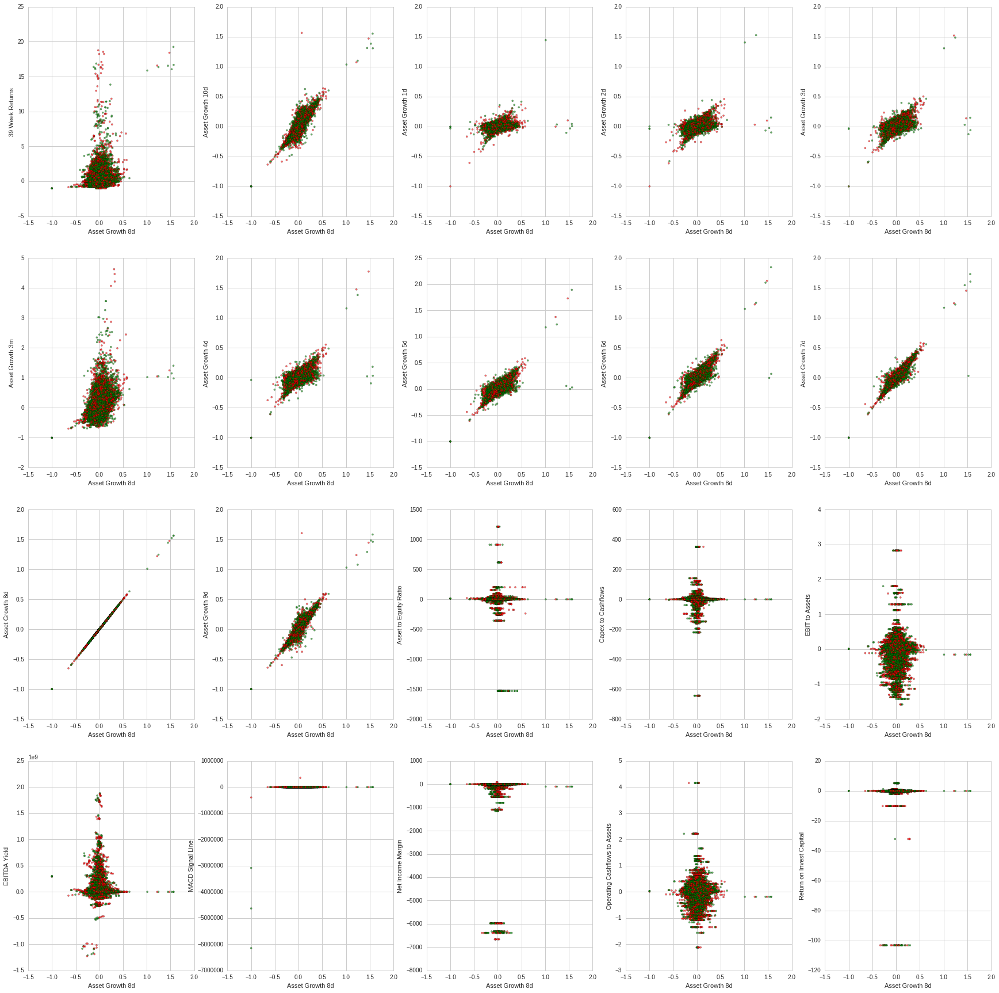

Mapping Asset Growth 9d against other variables


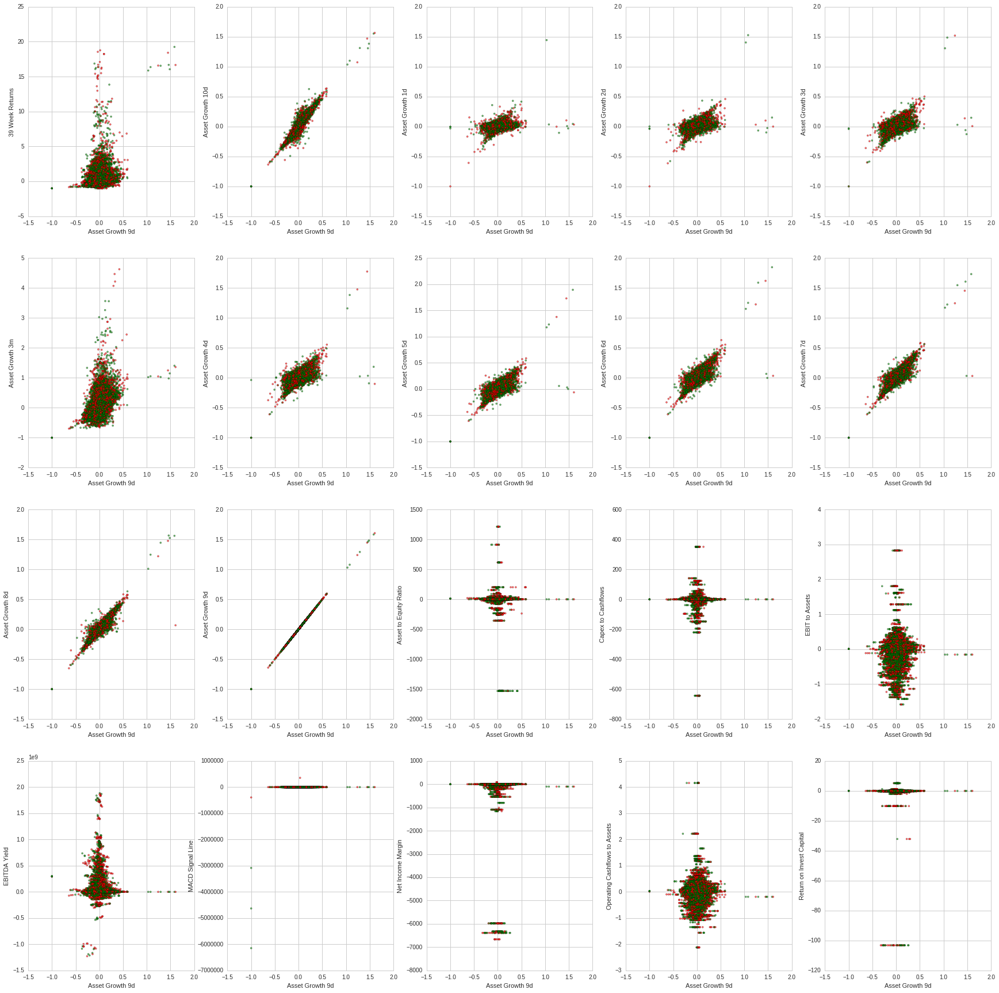

Mapping Asset to Equity Ratio against other variables


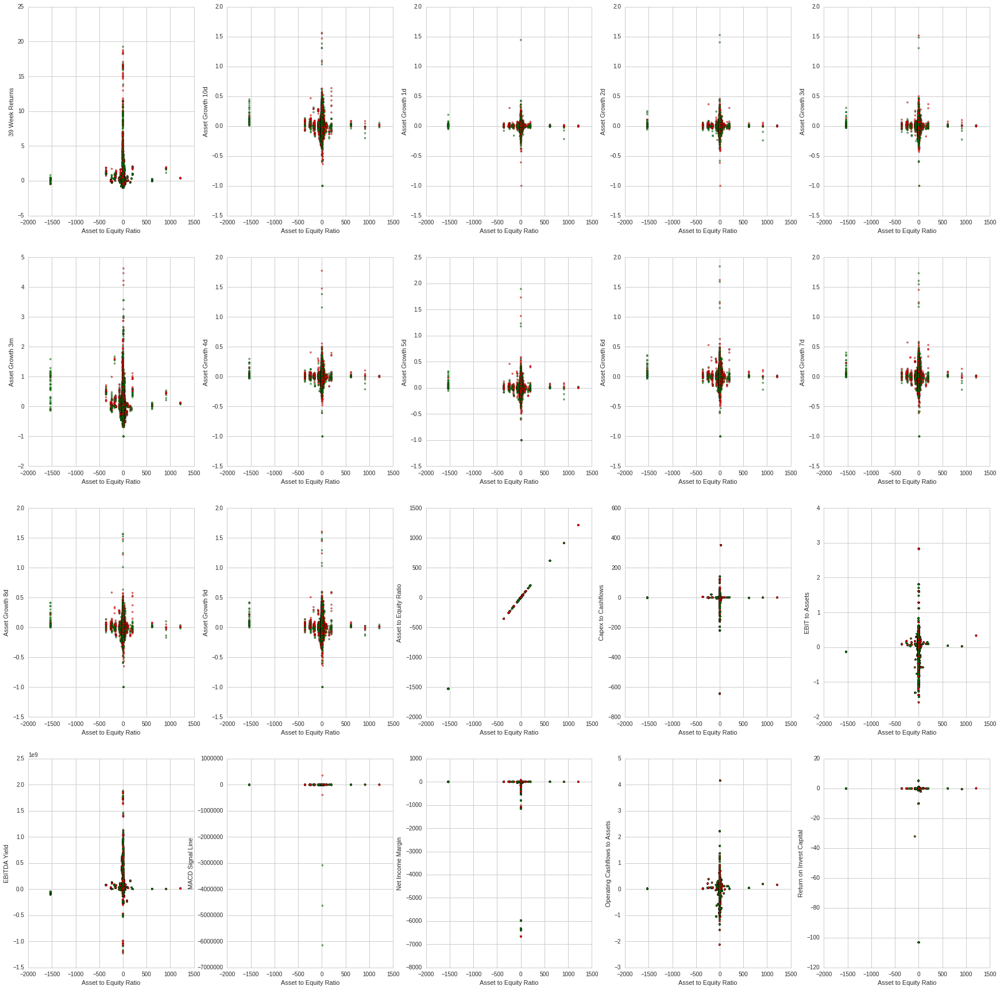

Mapping Capex to Cashflows against other variables


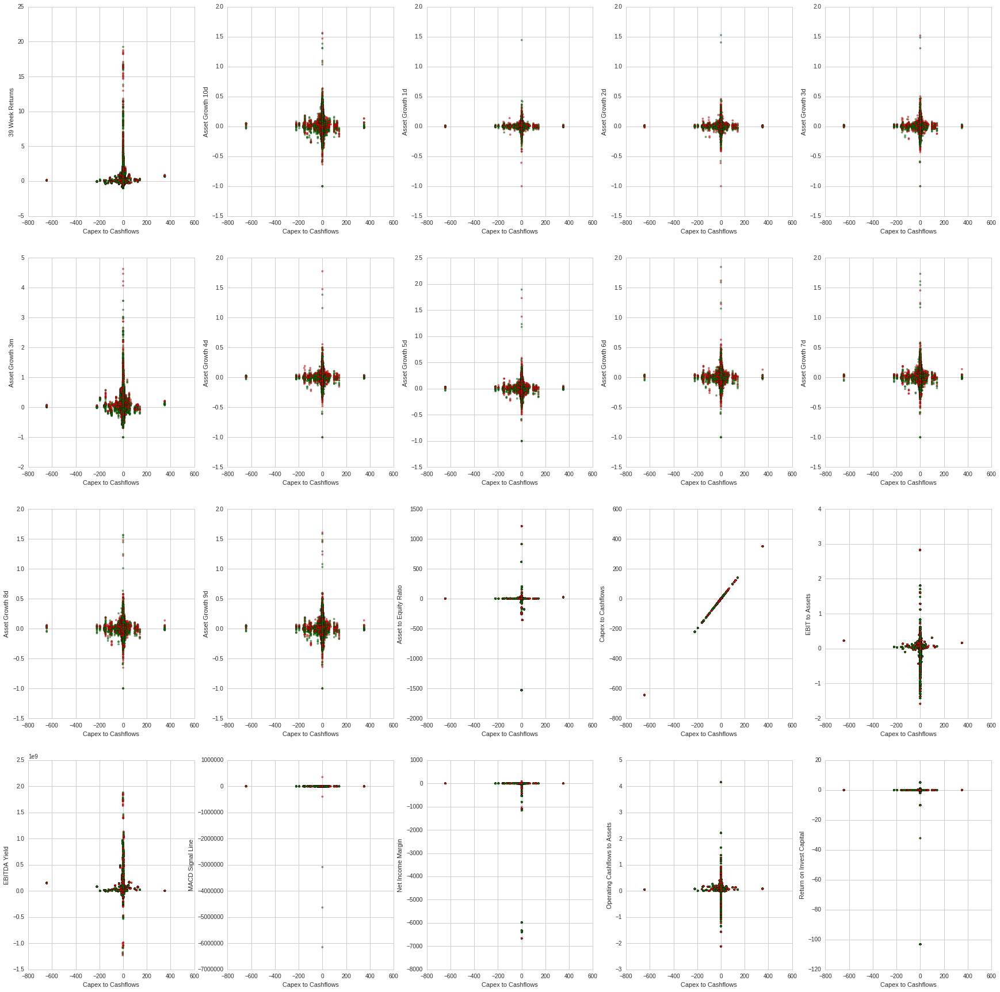

Mapping EBIT to Assets against other variables


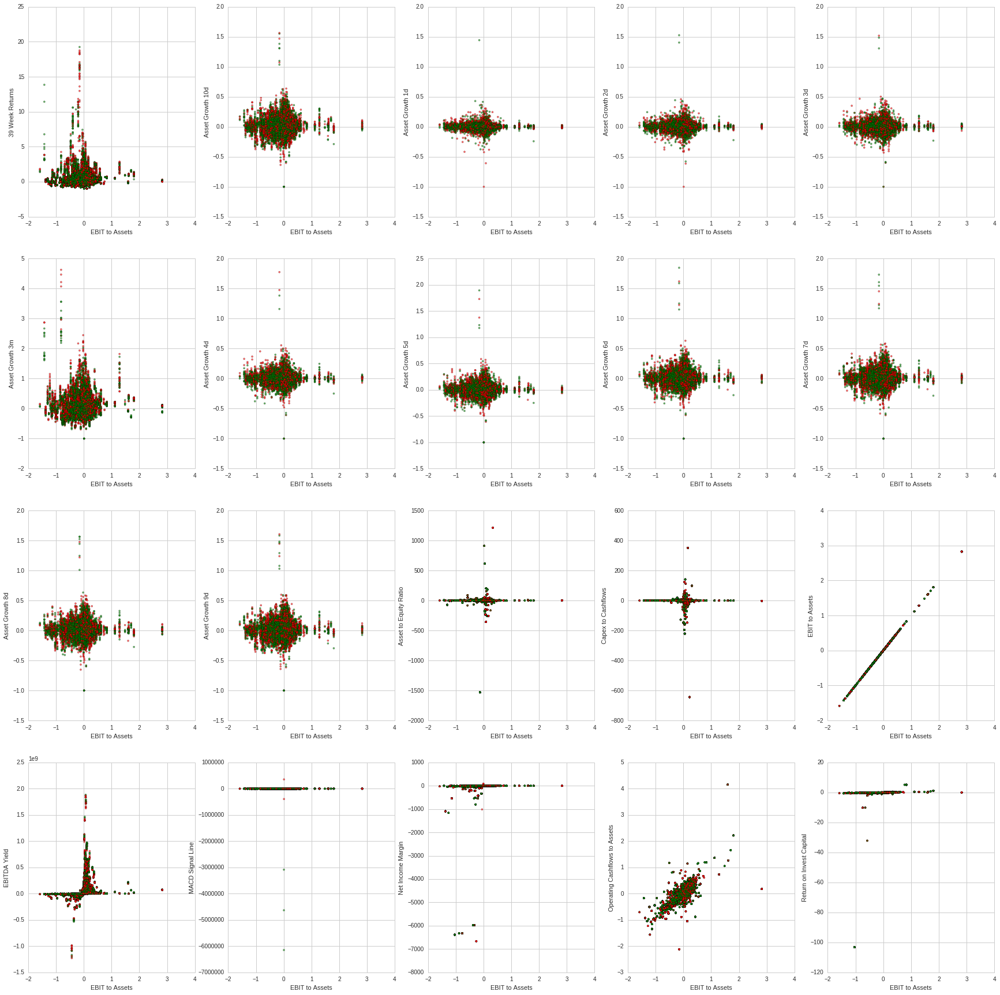

Mapping EBITDA Yield against other variables


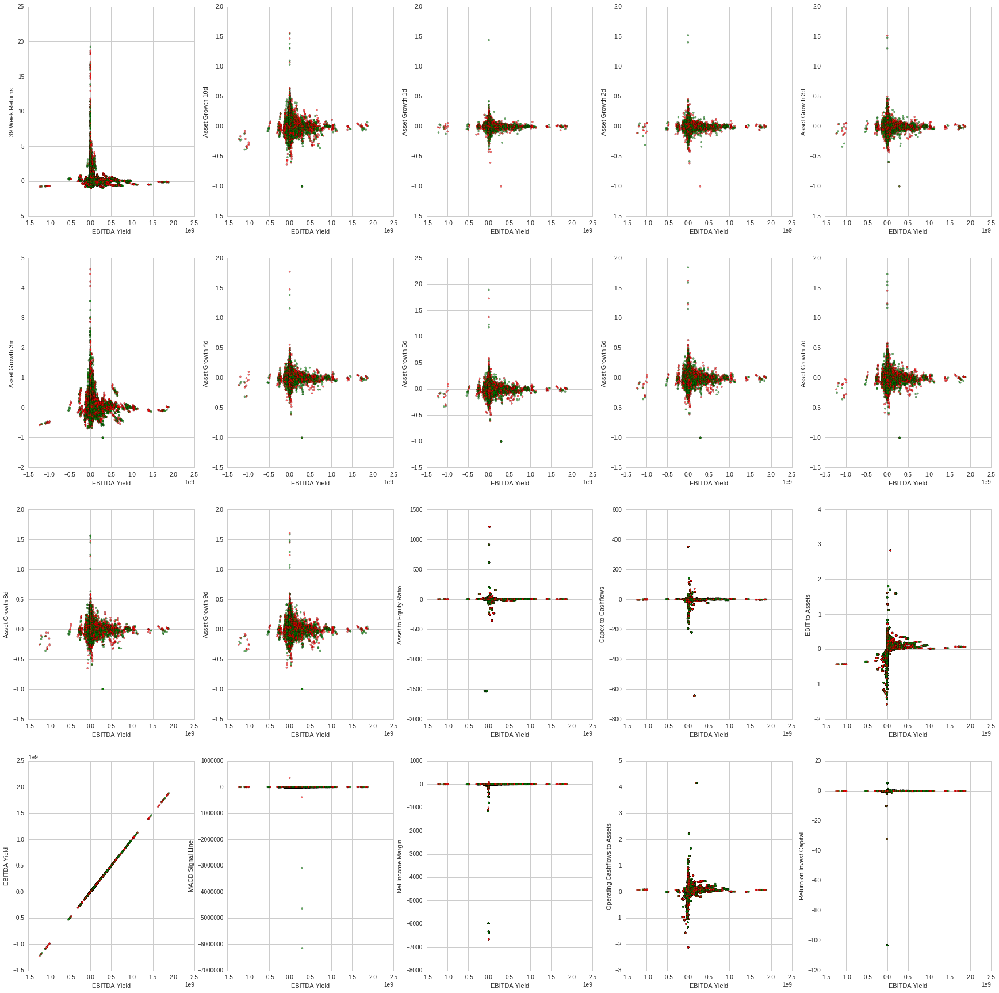

Mapping MACD Signal Line against other variables


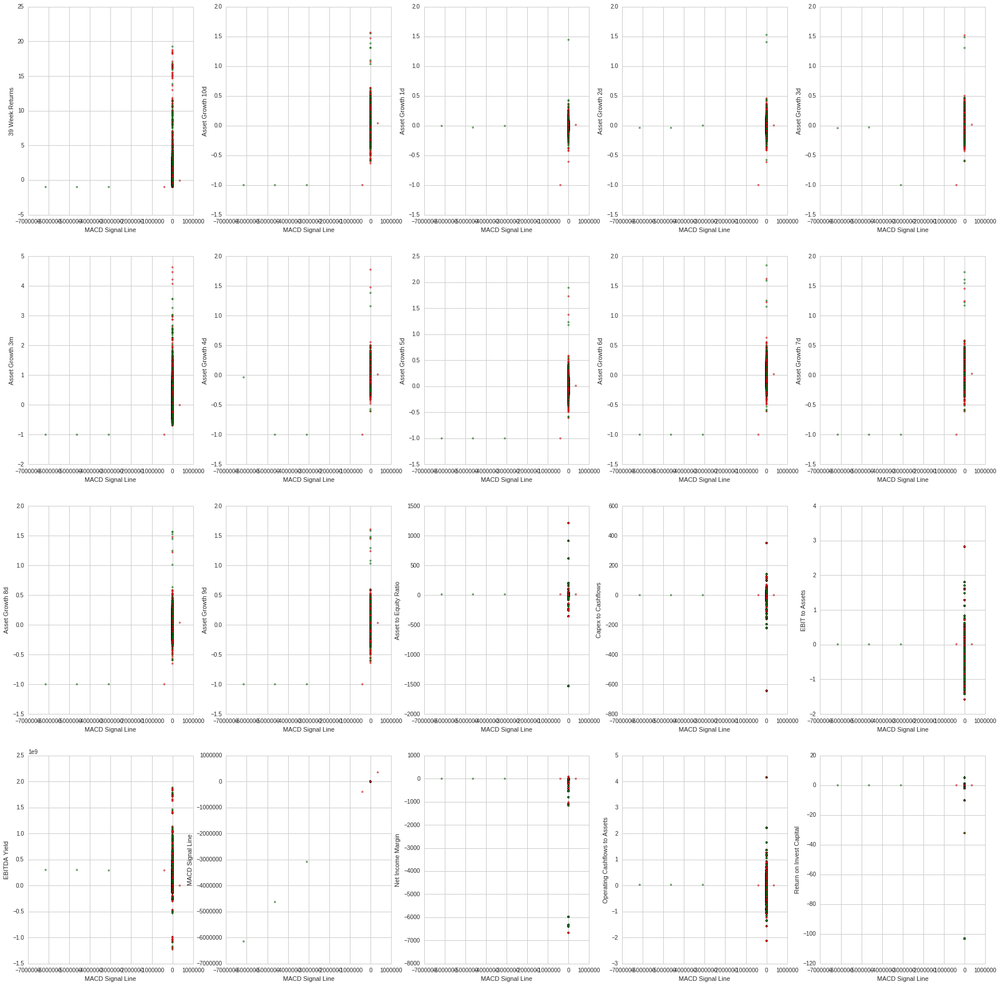

Mapping Net Income Margin against other variables


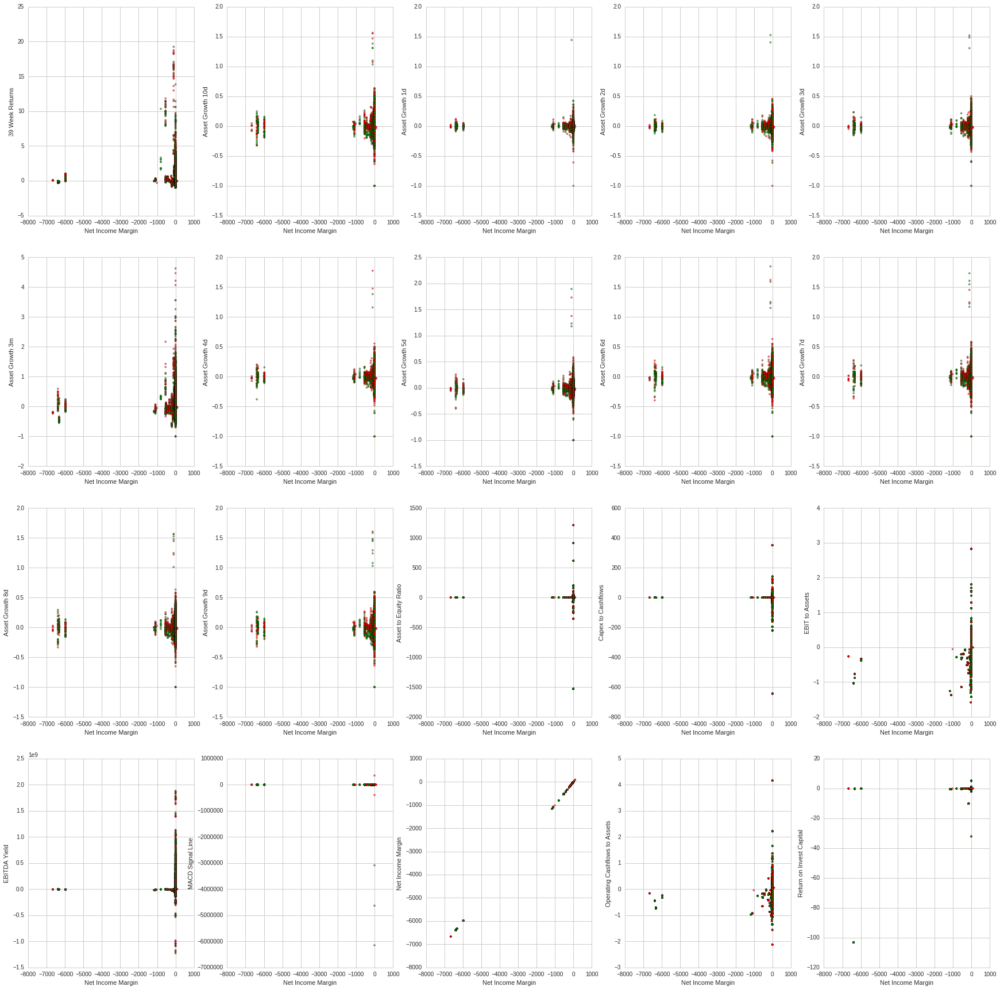

Mapping Operating Cashflows to Assets against other variables


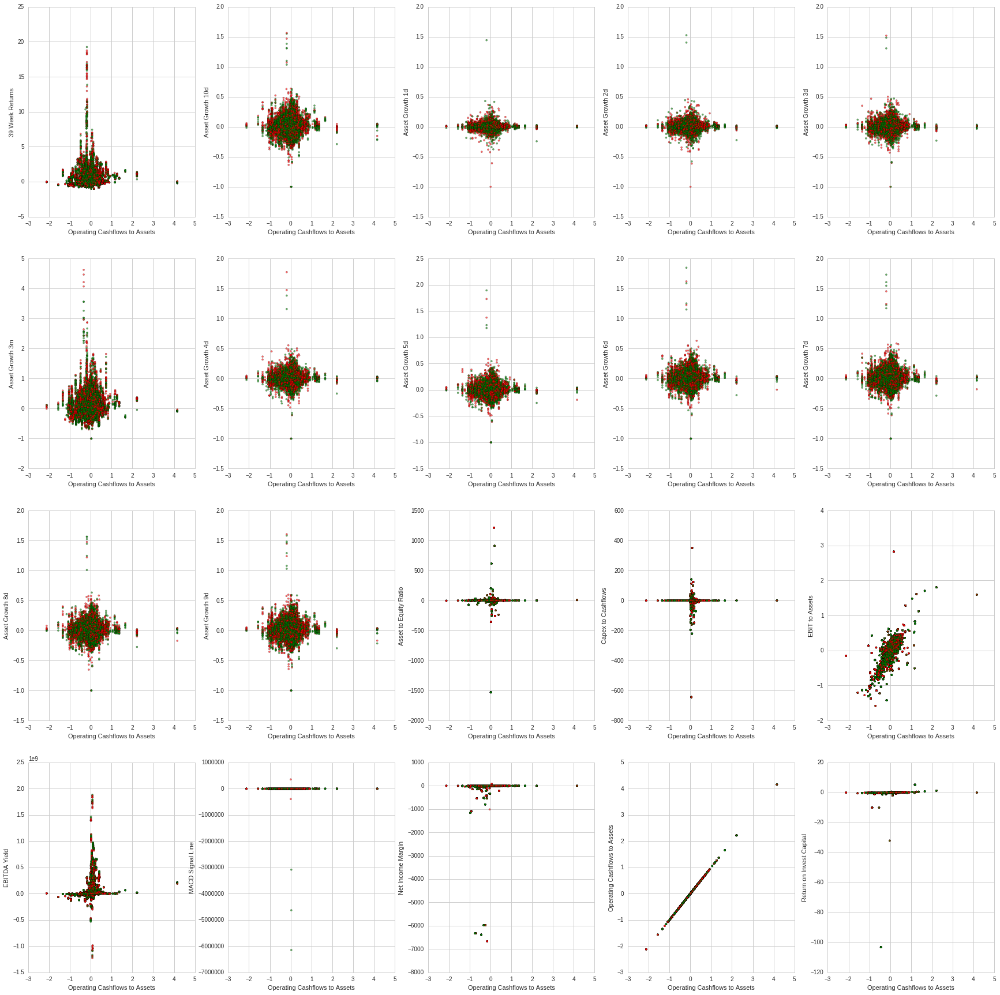

Mapping Return on Invest Capital against other variables


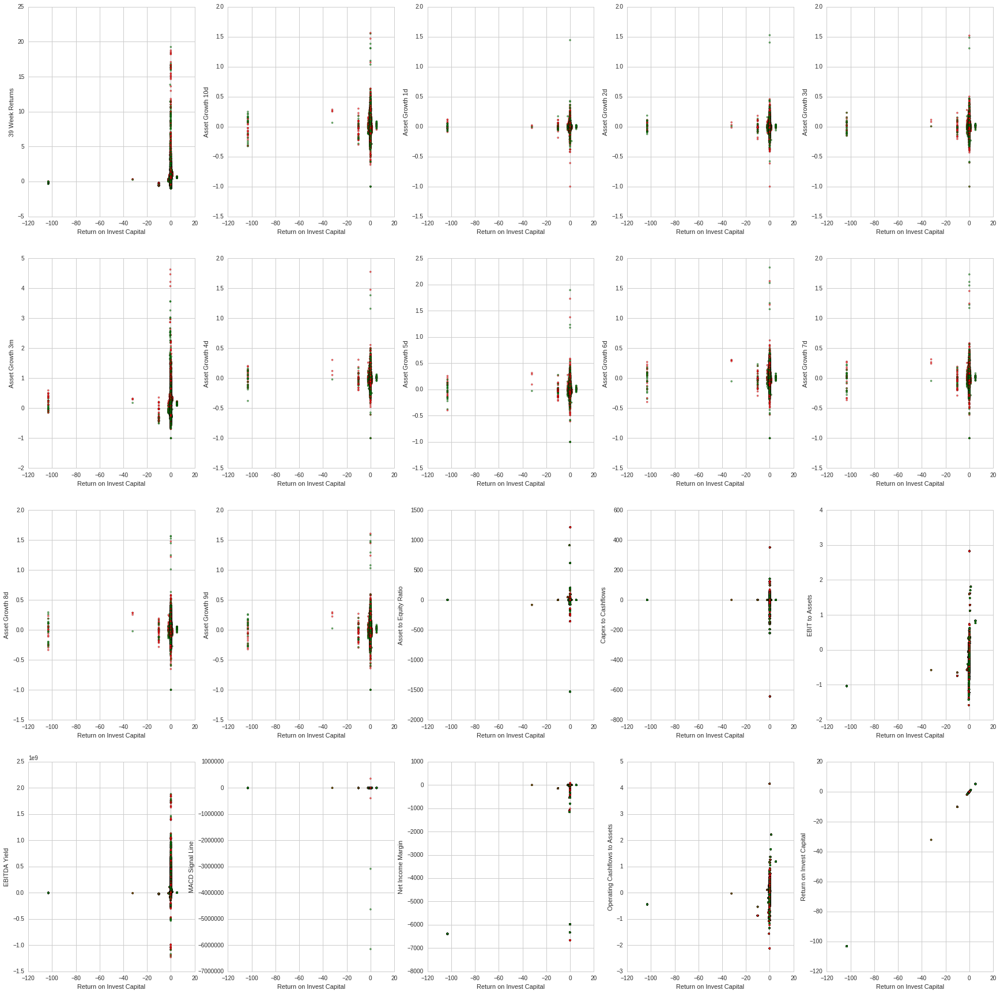

In [74]:
labels = ['39 Week Returns',
          'Asset Growth 10d',
          'Asset Growth 1d',
          'Asset Growth 2d',
          'Asset Growth 3d',
          'Asset Growth 3m',
          'Asset Growth 4d',
          'Asset Growth 5d',
          'Asset Growth 6d',
          'Asset Growth 7d',
          'Asset Growth 8d',
          'Asset Growth 9d',
          'Asset to Equity Ratio',
          'Capex to Cashflows',
          'EBIT to Assets',
          'EBITDA Yield',
          'MACD Signal Line',
          'Net Income Margin',
          'Operating Cashflows to Assets',
          'Return on Invest Capital']
N_vars = len(labels)
for i in range(N_vars):
    print 'Mapping %s against other variables'%(labels[i])
    plt.figure(figsize=(30,30))
    for j in range(N_vars):
        plt.subplot(np.sqrt(N_vars), np.sqrt(N_vars)+1, j + 1)
        plt.scatter(X[:, i], X[:, j], c=color, alpha= 0.6, s=10, edgecolor='k') 
        plt.xlabel(labels[i])
        plt.ylabel(labels[j])
    plt.show()

Probability of class 39 Week Returns


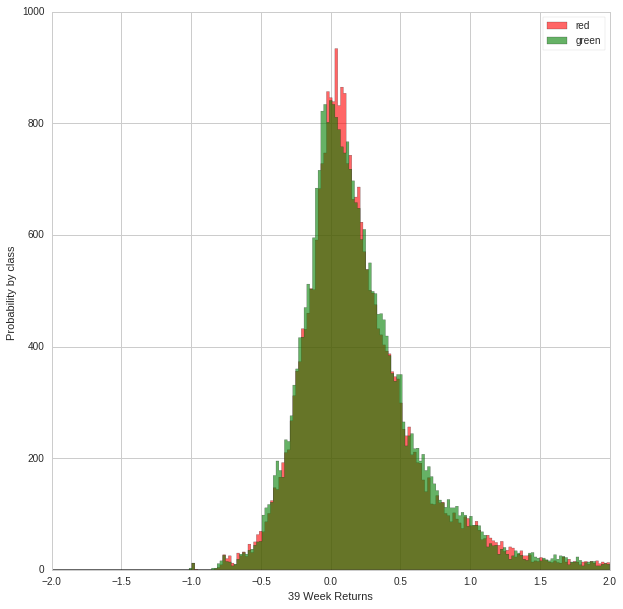

Probability of class Asset Growth 10d


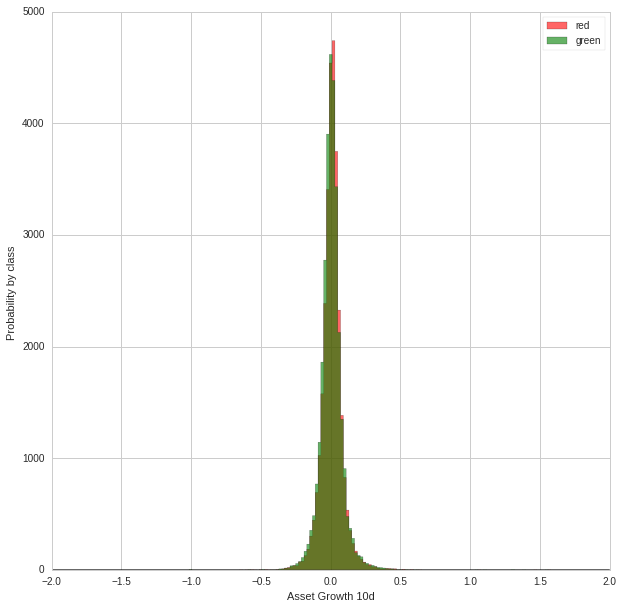

Probability of class Asset Growth 1d


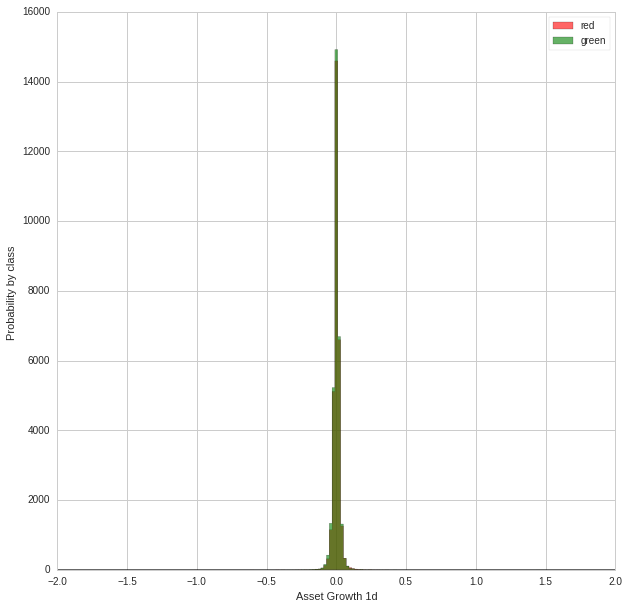

Probability of class Asset Growth 2d


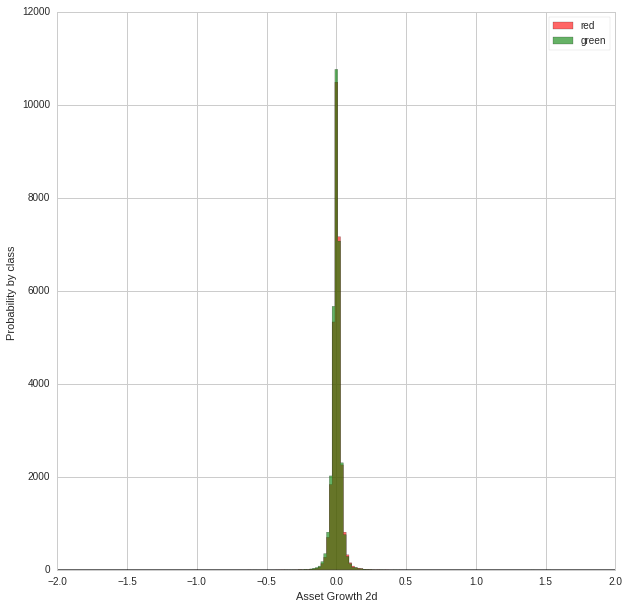

Probability of class Asset Growth 3d


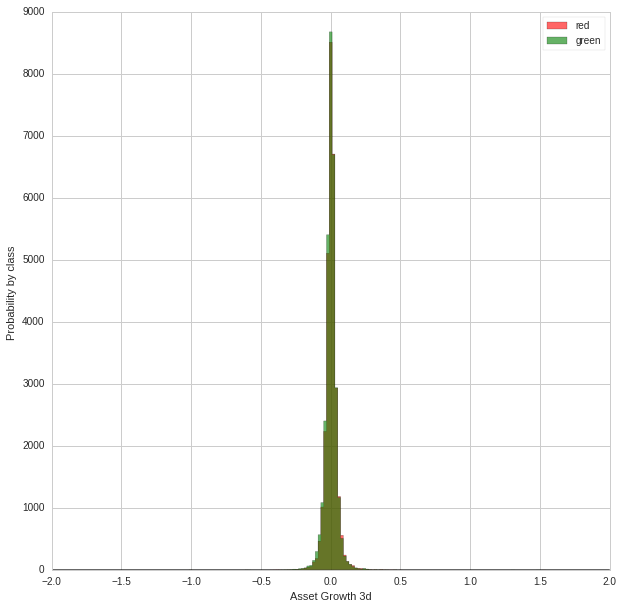

Probability of class Asset Growth 3m


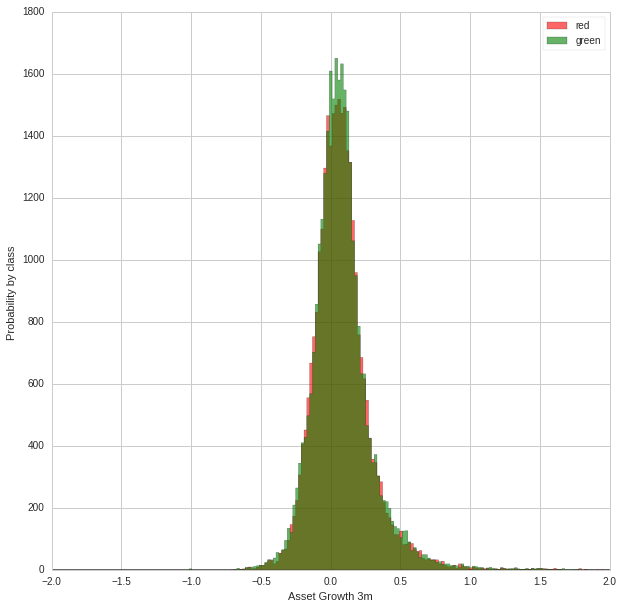

Probability of class Asset Growth 4d


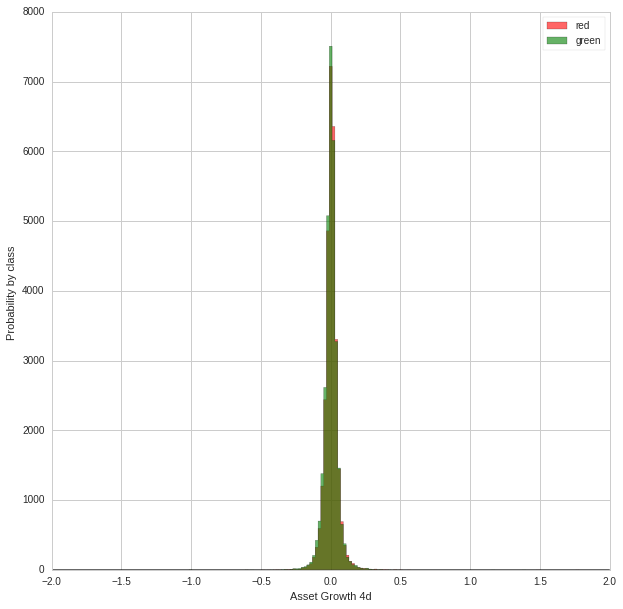

Probability of class Asset Growth 5d


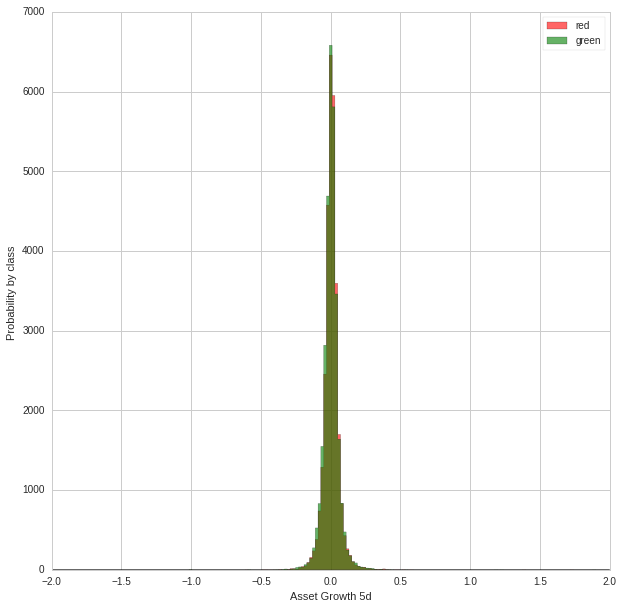

Probability of class Asset Growth 6d


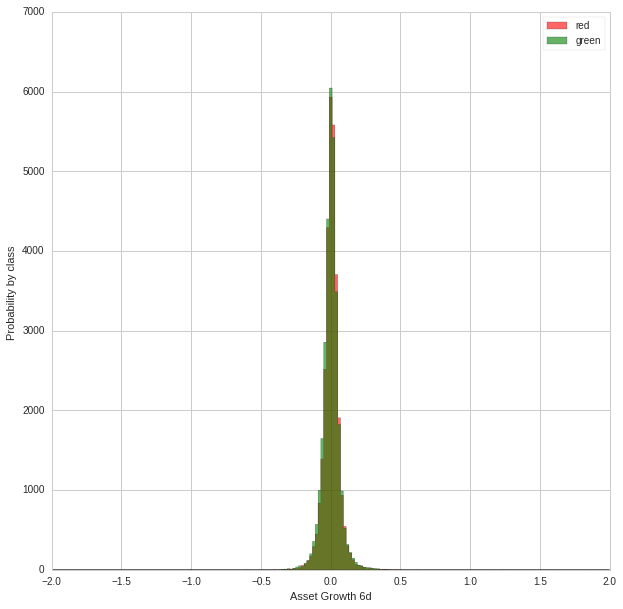

Probability of class Asset Growth 7d


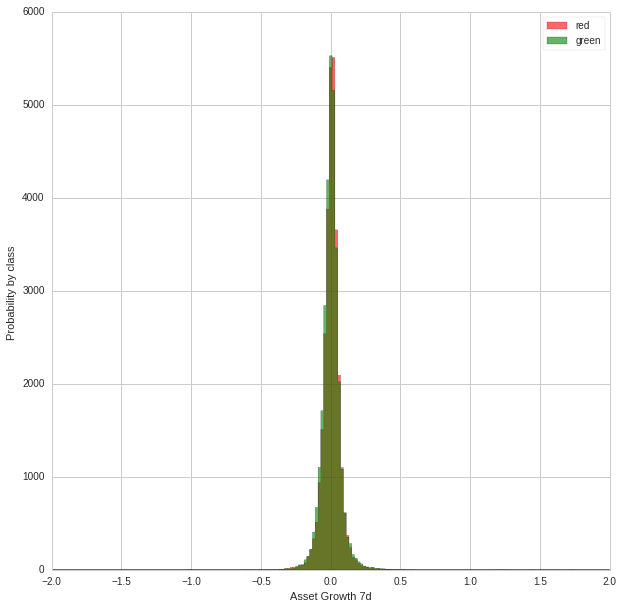

Probability of class Asset Growth 8d


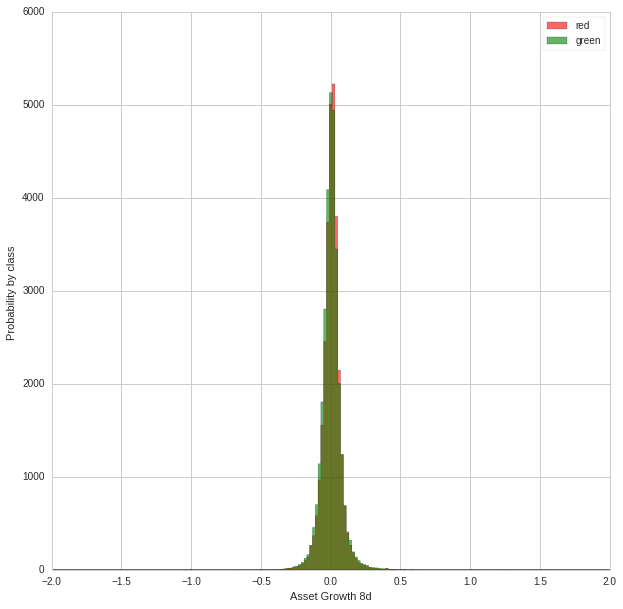

Probability of class Asset Growth 9d


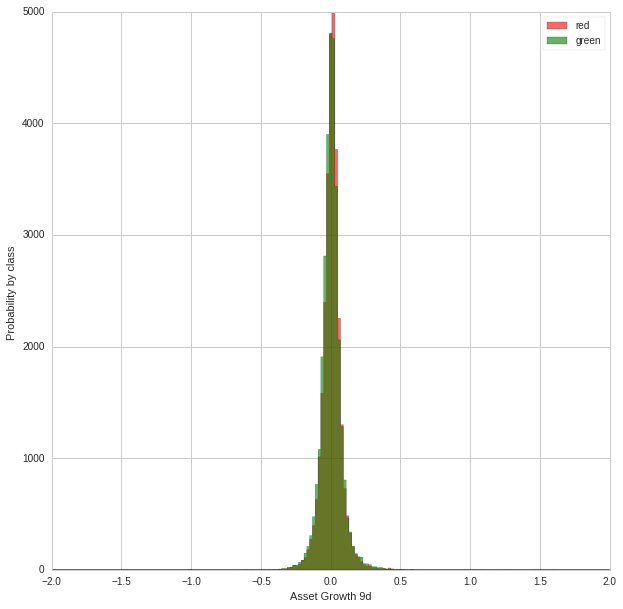

Probability of class Asset to Equity Ratio


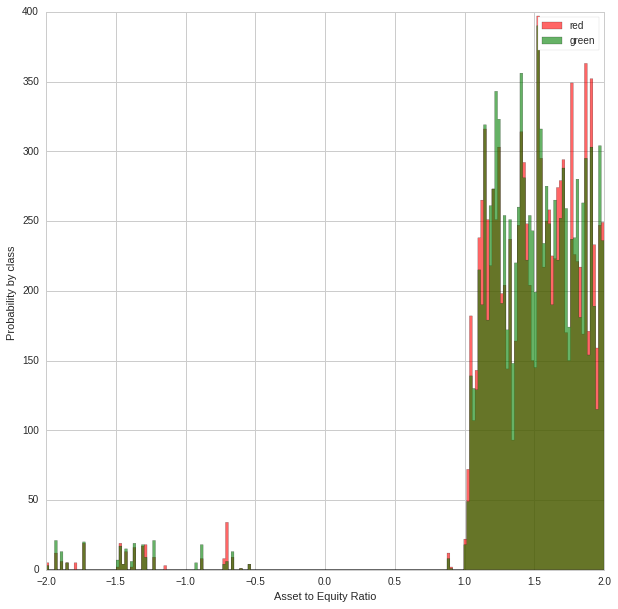

Probability of class Capex to Cashflows


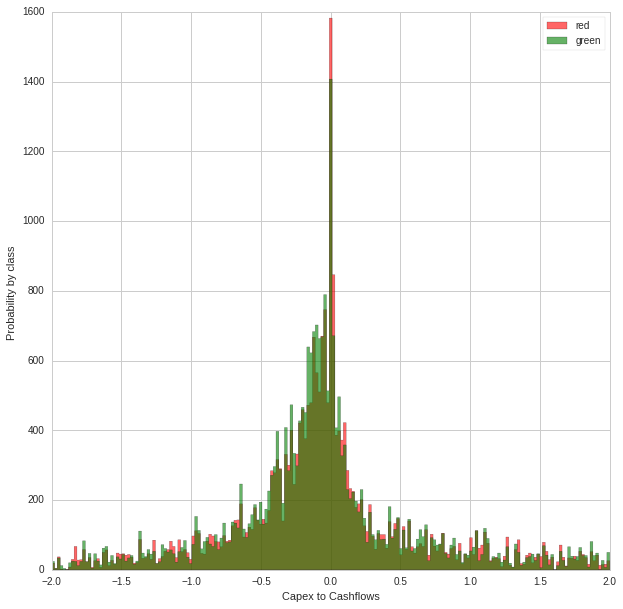

Probability of class EBIT to Assets


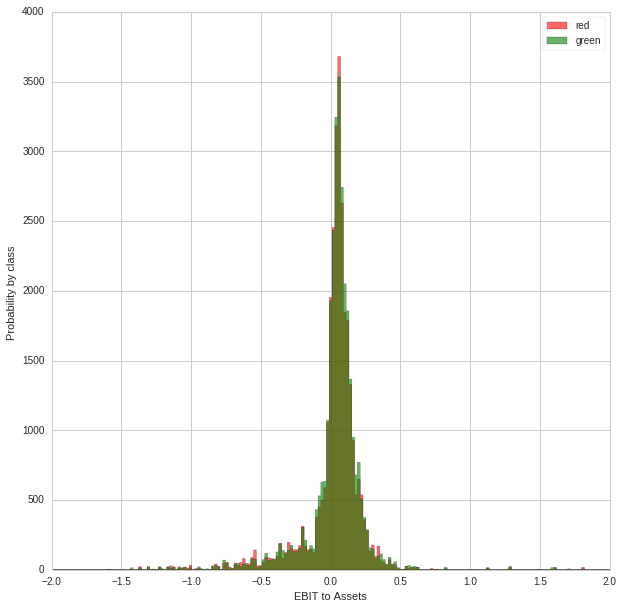

Probability of class EBITDA Yield


UnboundLocalError: local variable 'ymin' referenced before assignment

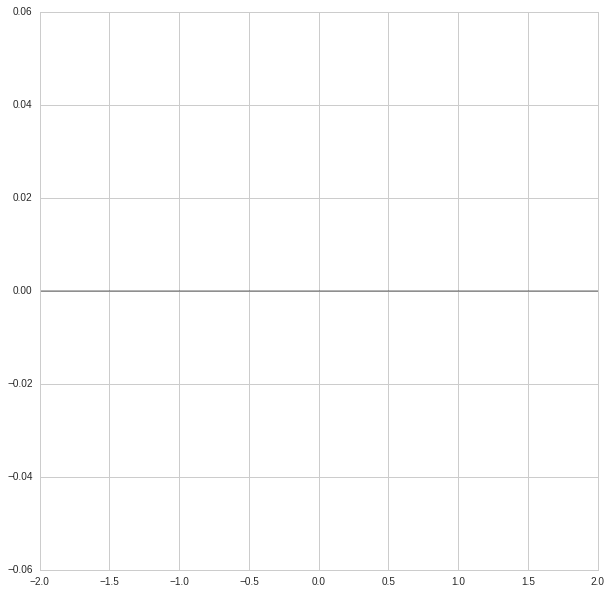

In [75]:
mask_g = (Y == 1)
mask_r = (Y == -1)
for i in range(N_vars):
    print 'Probability of class %s'%(labels[i])
    x = X[:,i]
    xg = x[mask_g]
    xr = x[mask_r]
    bins = np.linspace(-2, 2, 200)
    plt.figure(figsize=(10,10))
    plt.hist(xr, bins, alpha=0.6,  histtype='stepfilled', label='red',  color='red')
    plt.hist(xg, bins, alpha=0.6,  histtype='stepfilled', label='green', color='green' )
    plt.legend(loc='upper right')
    plt.xlabel(labels[i])
    plt.ylabel('Probability by class ')
    plt.show()

In [76]:
import pandas as pd      
df = pd.DataFrame(X_train, columns=labels)
df['target'] = Y_train
df.sample(20)

,39 Week Returns,Asset Growth 10d,Asset Growth 1d,Asset Growth 2d,Asset Growth 3d,Asset Growth 3m,Asset Growth 4d,Asset Growth 5d,Asset Growth 6d,Asset Growth 7d,...,Asset Growth 9d,Asset to Equity Ratio,Capex to Cashflows,EBIT to Assets,EBITDA Yield,MACD Signal Line,Net Income Margin,Operating Cashflows to Assets,Return on Invest Capital,target
22799,0.219713,-0.031241,0.007415,-0.011328,-0.014138,0.152817,-0.038099,-0.033160,-0.034859,-0.029672,...,-0.026877,1.841871,-0.258177,0.166786,3.321678e+06,1.862091,0.125939,0.072934,0.052145,-1.0
20962,0.391011,0.022701,-0.006466,-0.010730,0.002174,0.271694,-0.006466,0.015419,0.042986,0.064665,...,0.050593,4.928335,6.033698,0.020778,7.561996e+06,0.383800,-0.000914,0.057883,0.005620,-1.0
26105,0.347711,-0.048875,0.002138,0.009332,-0.007237,0.359439,0.004645,-0.005482,0.009332,-0.007062,...,-0.039617,1.611511,-0.094340,0.042857,3.698435e+06,0.610236,0.013228,0.310714,0.004669,1.0
55094,0.336419,0.024522,0.010836,0.022974,0.028536,0.085310,0.032747,0.031422,0.026075,0.022893,...,0.034076,5.239676,-0.029903,0.034148,3.140572e+06,0.558740,0.072865,0.038459,0.017795,-1.0
54969,0.188678,-0.010921,-0.035645,-0.030736,-0.033888,-0.049347,-0.049104,-0.036208,-0.033826,-0.023150,...,-0.014988,2.105201,0.378953,0.083759,8.846698e+06,0.339318,0.077508,-0.042921,0.023817,1.0
2554,0.083558,0.042802,-0.004950,0.003745,0.005000,-0.014706,-0.004950,-0.003717,-0.017115,-0.003717,...,0.029449,12.333646,0.436893,0.132219,5.502488e+06,-0.864988,0.043832,-0.088146,0.030417,1.0
26499,0.244084,0.014653,0.018833,0.020101,0.021840,0.129711,0.015712,0.011294,-0.007959,0.005421,...,0.011820,1.228982,-2.821394,0.112823,9.290629e+05,2.603214,0.067016,0.071162,0.024945,-1.0
6114,0.197912,0.007636,0.010372,0.031619,0.038216,0.078306,0.022201,0.038690,0.027614,0.026997,...,0.011958,3.474700,-0.154937,0.022437,2.719988e+06,0.510967,0.065716,0.021274,0.031822,-1.0
55908,0.434557,-0.070177,0.016842,-0.055257,-0.035928,-0.095366,-0.050113,-0.035688,-0.038799,-0.065241,...,-0.057049,1.802753,-4.945736,0.023593,1.534161e+08,-0.204900,0.074131,0.140277,0.005461,1.0
55851,0.062600,0.072199,-0.000705,0.011149,0.015969,0.097038,0.013553,0.014760,0.031335,0.048460,...,0.035721,3.513800,-147.067932,0.137413,1.045261e+07,1.228970,0.111091,0.183387,0.054940,-1.0


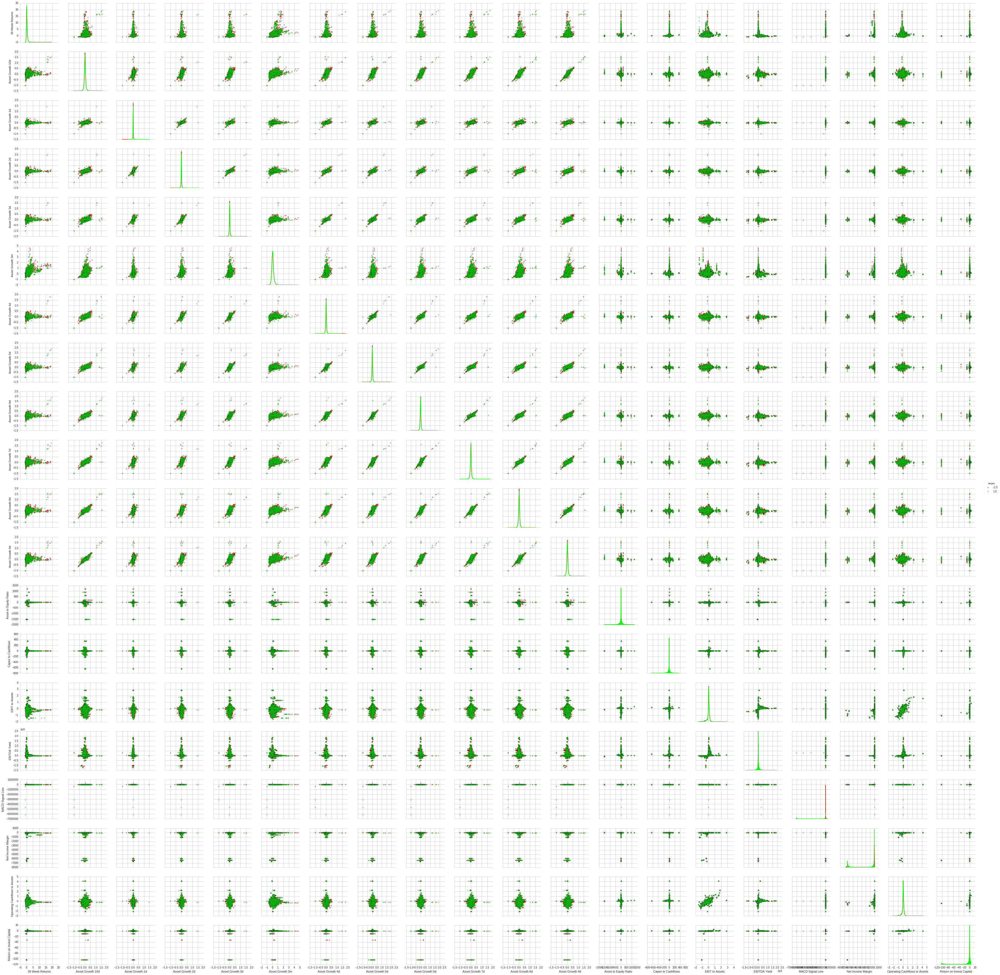

In [77]:
import seaborn as sns
sns.set()
palette = ['#FF0000','#00FF00']
sns.set_palette(palette)
sns.pairplot(df, vars=labels,  hue='target', diag_kind = 'kde', plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'});

## Train the Gaussian Naive Bayes model

In [78]:
start_timer = time()

# Train classifier
from sklearn.naive_bayes import GaussianNB
clf = GaussianNB()
clf.fit(X_train, Y_train);

end_timer = time()

In [79]:
print "Time to train : %0.2f secs" % (end_timer - start_timer)

Time to train : 0.03 secs


In [80]:
from sklearn import metrics

Y_pred = clf.predict(X_train)
print('Accuracy on train set = {:.2f}%'.format(metrics.accuracy_score(Y_train, Y_pred) * 100))

Accuracy on train set = 49.43%


In [81]:
# Predict!
Y_pred = clf.predict(X_test)

Y_pred_prob = clf.predict_proba(X_test)

In [82]:
print 'Predictions:', Y_pred
print 'Probabilities of class == 1:', Y_pred_prob[:, 1] * 100

Predictions: [-1. -1. -1. ..., -1. -1. -1.]
Probabilities of class == 1: [ 2.99130932  1.08688395  2.27963111 ...,  5.07837128  5.06740863
  2.28424867]


In [83]:
print('Accuracy on test set = {:.2f}%'.format(metrics.accuracy_score(Y_test, Y_pred) * 100))
print('Log-loss = {:.5f}'.format(metrics.log_loss(Y_test, Y_pred_prob)))

Accuracy on test set = 50.52%
Log-loss = 1.80912


## Train the Logistic Regression Classifier

In [84]:
start_timer = time()

# Train classifier
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()
clf.fit(X_train, Y_train);

end_timer = time()

In [85]:
print "Time to train : %0.2f secs" % (end_timer - start_timer)

Time to train : 0.26 secs


In [86]:
Y_pred = clf.predict(X_train)
print('Accuracy on train set = {:.2f}%'.format(metrics.accuracy_score(Y_train, Y_pred) * 100))

Accuracy on train set = 49.69%


In [87]:
# Predict!
Y_pred = clf.predict(X_test)

Y_pred_prob = clf.predict_proba(X_test)

In [88]:
print 'Predictions:', Y_pred
print 'Probabilities of class == 1:', Y_pred_prob[:, 1] * 100

Predictions: [-1. -1. -1. ..., -1. -1. -1.]
Probabilities of class == 1: [ 49.77664594  49.11524551  49.99321902 ...,  49.99810566  49.97652035
  49.99984014]


In [89]:
print('Accuracy on test set = {:.2f}%'.format(metrics.accuracy_score(Y_test, Y_pred) * 100))
print('Log-loss = {:.5f}'.format(metrics.log_loss(Y_test, Y_pred_prob)))

Accuracy on test set = 49.79%
Log-loss = 0.69337


## Train the Support Vector Classifier

In [91]:
start_timer = time()

# Train classifier
from sklearn.svm import LinearSVC
clf = LinearSVC()
clf.fit(X_train, Y_train);

end_timer = time()

In [92]:
print "Time to train : %0.2f secs" % (end_timer - start_timer)

Time to train : 7.91 secs


In [93]:
Y_pred = clf.predict(X_train)
print('Accuracy on train set = {:.2f}%'.format(metrics.accuracy_score(Y_train, Y_pred) * 100))

Accuracy on train set = 50.37%


In [98]:
# Predict!
Y_pred = clf.predict(X_test)

Y_pred_prob = clf.decision_function(X_test)

In [102]:
print 'Predictions:', Y_pred
print 'Probabilities of class == 1:', Y_pred_prob

Predictions: [ 1.  1.  1. ...,  1.  1.  1.]
Probabilities of class == 1: [  3.52585012e+00   1.39840471e+01   1.07834911e-01 ...,   3.06283776e-02
   3.72624403e-01   3.09294644e-03]


In [103]:
print('Accuracy on test set = {:.2f}%'.format(metrics.accuracy_score(Y_test, Y_pred) * 100))
print('Log-loss = {:.5f}'.format(metrics.log_loss(Y_test, Y_pred_prob)))

Accuracy on test set = 50.26%
Log-loss = 6.17115
